<a
href="https://colab.research.google.com/github/wingated/cs474_labs_f2019/blob/master/DL_Lab10.ipynb"
  target="_parent">
  <img
    src="https://colab.research.google.com/assets/colab-badge.svg"
    alt="Open In Colab"/>
</a>

In [ ]:
from torchvision.models import resnet152, resnet50, get_model_weights, ResNet152_Weights, ResNet50_Weights
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, Dataset
import torch
from torch import optim, nn
import zipfile
import os
import sys
from PIL import Image, ImageOps
from tqdm import tqdm
import numpy as np
from matplotlib import pyplot as plt
import keras
import tensorflow_datasets as tfds

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
torch.cuda.is_available()
print(device)

cuda



# DAMAGED MERCHANDISE CLASSIFICATION

### The purpose of this project is to train and compare different pre-trained models with a custom dataset that is divided into good and bad merchandise.

**Abstract:** Consumers want to receive the highest price per value for purchases, and retailers want to provide good value while profiting to ensure repeat business. Using Deep Learning techniques, we can classify images, looking for danger signs such as beat-up cardboard, bruised fruit, broken eggs, ensuring that merchandise generally is sold at the highest quality, and that merchandise below expectations is able to be suitably discounted or discarded. This is also important for online purchases- even if an item is of good quality initially, the process of shipping and handling may decrease the quality, in which case a direct comparison is useful for answering consumer complaints.

**Dataset:** The dataset used in this project is one we collected and implemented ourselves. We took pictures of merchandise, constituting of boxes of various products, like cereal, oatmeal, pancake mix, etc. We then damaged the boxes a little (without damaging the actual product) so some creases, dents, and scratches could be formed on the boxes. Then, we classified the train and test data into a folder called 'image_classification', uploaded it to Kaggle.com, and proceeded from there as seen in lab 8.

**Approach:** We intend to use pretrained models such as ResNet and variations, and ResNetXT, which ntroduces a hyper-parameter called cardinality to adjust the model capacity. We look forward for the network to learn on texture rather than shape. We perform a naive grid-search to find the most optimal parameters in order to increase accuracy for the classification.

# 1) Collection and Cleaning of Data
### 8 hours
Mainly cardborad boxes and related products

# 2) Coding and Debugging
### 6 hours

# 3) Literature Review (reading and researching)
## 5 hours



#### Help for downloading kaggle datasets
Downloading Kaggle datasets requires authentication, so you can't just download from a url. Here are some step-by-step instructions of how to get Kaggle datasets in Colab

1. Create an API key in Kaggle
    - Click on profile photo
    - Go to 'My Account'
    - Scroll down to the API access section and click "Create New API Token"
    - `kaggle.json` is now downloaded to your computer

2. Upload the API key and install the Kaggle API client by running the next cell (run it again if it throws an error the first time). Also, `files.upload()` may not work in Firefox. One solution is to expand the Files banner (indicated by the '>' tab on the left side of the page) and use that to upload the key.

In [ ]:
# Run this cell and select the kaggle.json file downloaded
# from the Kaggle account settings page.
from google.colab import files
files.upload()
# Next, install the Kaggle API client.
!pip install -q kaggle
# Let's make sure the kaggle.json file is present.
!ls -lha kaggle.json
# The Kaggle API client expects this file to be in ~/.kaggle,
# so move it there.
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
# This permissions change avoids a warning on Kaggle tool startup.
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
-rw-r--r-- 1 root root 67 Oct 12 00:46 kaggle.json


In [ ]:
# Example download command for dataset found here: https://www.kaggle.com/datasets/erikaibarra/image-classification
!kaggle datasets download -d erikaibarra/image-classification

100% 1.25G/1.25G [00:19<00:00, 117MB/s] 
100% 1.25G/1.25G [00:19<00:00, 69.7MB/s]


#### Make the Dataset class
See the implementation below for reference, and implement a dataset class for the dataset you choose.

In [ ]:
#########################
# Implement own Dataset
#########################

class CustomDataset(Dataset):
    def __init__(self, zip_file='./image-classification.zip', size=256, train=True, upload=False, max_size=200):
        super(CustomDataset, self).__init__()

        self.max_size = max_size

        self.train = train
        extract_dir = os.path.splitext(zip_file)[0]
        if not os.path.exists(extract_dir):
            os.makedirs(extract_dir)
            self.extract_zip(zip_file, extract_dir)
            # Resize the images - originally they are high resolution. We could do this
            # in the DataLoader, but it will read the full-resolution files from disk
            # every time before resizing them, making training slow
            self.resize(extract_dir, size=size)

        postfix = 'train' if train else 'test'

        if train:
            # The dataset mistakenly has a train_data folder inside of train_data
            self.dataset_folder = datasets.ImageFolder(os.path.join(extract_dir, 'image_classification', 'seg_train'), transform=transforms.Compose([transforms.ToTensor()]))
        else:
            self.dataset_folder = datasets.ImageFolder(os.path.join(extract_dir, 'image_classification', 'seg_test'), transform=transforms.Compose([transforms.ToTensor()]))

    def extract_zip(self, zip_file, extract_dir):
        print("Extracting", zip_file)
        with zipfile.ZipFile(zip_file, 'r') as zip_ref:
            zip_ref.extractall(extract_dir)


    def resize(self, path, size=256):
        """Resizes all images in place"""
        print("Resizing images")
        dirs = os.walk(path)
        for root, dirs, files in os.walk(path):
            for item in files:
                name = os.path.join(root, item)
                if os.path.isfile(name):
                    im = Image.open(name)
                    im = ImageOps.fit(im, (size, size))
                    im = ImageOps.grayscale(im) # change to grayscale so we don't learn the color of the boxes
                    im.save(name[:-3] + 'bmp', 'BMP')
                    os.remove(name)

    def __getitem__(self, i):
        i = np.random.randint(0, len(self.dataset_folder) - 1)
        return self.dataset_folder[i]

    def __len__(self):
        if len(self.dataset_folder) > self.max_size:
          return self.max_size
        else:
          return len(self.dataset_folder)

custom_data = CustomDataset()

## ResNet152 Pre-trained Image Classifier

In [ ]:
from torch._C import NoneType
class CustomResNet152(nn.Module):
    def __init__(self, num_classes, weight, start_frozen=False):
        super(CustomResNet152, self).__init__()

        # Part 1.2
        # Load the model - make sure it is pre-trained
        self.resnet = resnet152(weights=weight) # a couple variations for each resnet

        # Part 1.4
        if start_frozen:
            # Turn off all gradients of the resnet
            for params in self.resnet.parameters():
              params.requires_grad = False
        # Part 1.2
        # Look at the code of torchvision.models.resnet152 to find the name of the attribute to override (the last layer of the resnet)
        # Override the last layer of the neural network to map to the correct number of classes. Note that this new layer has requires_grad = True
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, num_classes)

    def unfreeze(self, n_layers):
        # Part 1.4
        # Turn on gradients for the last n_layers
        if n_layers > 0:
          params_to_unfreeze = 2*n_layers
          for param in reversed(list(self.resnet.parameters())):
            param.requires_grad = True
            params_to_unfreeze -= 1
            if params_to_unfreeze == 0:
              break

    def forward(self, x):
        # Part 1.2
        # Pass x through the resnet
        return self.resnet(x)

## ResNet50 Pre-trained Image Classifier

In [ ]:
from torch._C import NoneType
class CustomResNet50(nn.Module):
    def __init__(self, num_classes, weight, start_frozen=False):
        super(CustomResNet50, self).__init__()

        # Part 1.2
        # Load the model - make sure it is pre-trained
        self.resnet = resnet50(weights=weight) # a couple variations for each resnet

        # Part 1.4
        if start_frozen:
            # Turn off all gradients of the resnet
            for params in self.resnet.parameters():
              params.requires_grad = False
        # Part 1.2
        # Look at the code of torchvision.models.resnet152 to find the name of the attribute to override (the last layer of the resnet)
        # Override the last layer of the neural network to map to the correct number of classes. Note that this new layer has requires_grad = True
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, num_classes)

    def unfreeze(self, n_layers):
        # Part 1.4
        # Turn on gradients for the last n_layers
        if n_layers > 0:
          params_to_unfreeze = 2*n_layers
          for param in reversed(list(self.resnet.parameters())):
            param.requires_grad = True
            params_to_unfreeze -= 1
            if params_to_unfreeze == 0:
              break

    def forward(self, x):
        # Part 1.2
        # Pass x through the resnet
        return self.resnet(x)

In [ ]:
def accuracy(y_hat, y_truth):
    """Gets average accuracy of a vector of predictions"""

    preds = torch.argmax(y_hat, dim=1)
    acc = torch.mean((preds == y_truth).float())
    return acc

def evaluate(model, objective, val_loader, device):
    """Gets average accuracy and loss for the validation set"""

    val_losses = []
    val_accs = []
    # model.eval() so that batchnorm and dropout work in eval mode
    model.eval()
    # torch.no_grad() to turn off computation graph creation. This allows for temporal
    # and spatial complexity improvements, which allows for larger validation batch
    # sizes so it’s recommended
    with torch.no_grad():
        for x, y_truth in val_loader:

            x, y_truth = x.to(device), y_truth.to(device)
            y_hat = model(x)
            val_loss = objective(y_hat, y_truth)
            val_acc = accuracy(y_hat, y_truth)

            val_losses.append(val_loss.item())
            val_accs.append(val_acc)

    model.train()

    return torch.mean(torch.Tensor(val_losses)), torch.mean(torch.Tensor(val_accs))

In [ ]:
def train(lr=.05, batches=5, num_epoches=20, start_frozen=False, model_unfreeze=0, resnet='resnet152', weight=ResNet152_Weights.DEFAULT, objective=nn.CrossEntropyLoss(), optimizer=optim.SGD):
    """Fine-tunes a CNN
    Args:
        start_frozen (bool): whether to start with the network weights frozen.
        model_unfreeze (int): the maximum number of network layers to unfreeze
    """
    epochs = num_epoches
    #lr = .05 gives decent results
    # lr = lr
    val_every = 3
    num_classes = 2
    batch_size = batches

    # Data
    train_dataset = CustomDataset(upload=True, train=True)
    val_dataset = CustomDataset(upload=True, train=False)
    train_loader = DataLoader(train_dataset,
                              shuffle=True,
                              num_workers=2,
                              batch_size=batch_size)
    val_loader = DataLoader(val_dataset,
                              shuffle=True,
                              num_workers=2,
                              batch_size=batch_size)

    # Model
    if resnet == 'resnet50':
        model = CustomResNet50(num_classes, weight=weight, start_frozen=start_frozen).to(device)
    else:
        model = CustomResNet152(num_classes, weight=weight, start_frozen=start_frozen).to(device)

    # Objective

    # objective = nn.CrossEntropyLoss()
    # Optimizer
    optimizer = optimizer(model.parameters(), lr=lr, weight_decay=1e-1)

    # Progress bar
    pbar = tqdm(total=len(train_loader) * epochs)

    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []

    cnt = 0
    i = 0

    avg_val_batch_loss = []
    avg_val_batch_acc = []

    avg_train_batch_loss = []
    avg_train_batch_acc = []

    for epoch in range(epochs):

        # Implement model unfreezing
        if epoch < model_unfreeze:
            # Part 1.4
            # Unfreeze the last layers, one more each epoch
            model.unfreeze(i)
            i += 1

        for x, y_truth in train_loader:

            x, y_truth = x.to(device), y_truth.to(device)

            optimizer.zero_grad()

            y_hat = model(x) # custom resnet class doesn't interact with data
            #print(y_hat)
            #print(y_truth)
            train_loss = objective(y_hat, y_truth) # try flattening or squeezing if mse_loss is active
            train_acc = accuracy(y_hat, y_truth)

            train_loss.backward()
            optimizer.step()

            train_accs.append(train_acc.item())
            train_losses.append(train_loss.item())

            if cnt % val_every == 0:
                val_loss, val_acc = evaluate(model, objective, val_loader, device)
                val_losses.append(val_loss)
                val_accs.append(val_acc.item())

            pbar.set_description('train loss:{:.4f}, train accuracy:{:.4f}.'.format(train_loss.item(), train_acc))
            pbar.update(1)
            cnt += 1

        avg_val_batch_loss.append(np.mean(val_losses))
        avg_val_batch_acc.append(np.mean(val_accs))
        avg_train_batch_loss.append(np.mean(train_losses))
        avg_train_batch_acc.append(np.mean(train_accs))

            # average batch accuracy per epoch

    pbar.close()
    plt.subplot(121)
    plt.plot(np.arange(len(avg_val_batch_acc)), avg_val_batch_acc, label='Avg. Val. Accuracy for Batches in Epoch')
    plt.xlabel("Number of Epochs")
    plt.plot(np.arange(len(avg_train_batch_acc)), avg_train_batch_acc, label='Avg. Train for Batches in Epoch')
    plt.legend()
    plt.subplot(122)
    plt.plot(np.arange(len(avg_val_batch_loss)), avg_train_batch_loss, label='Train Loss')
    plt.xlabel("Number of Epochs")
    plt.plot(np.arange(len(avg_train_batch_loss)), avg_val_batch_loss, label='Val Loss')
    plt.legend()
    plt.show()
    #print(val_losses)
    #print(np.mean(val_accs[-100:]))
    print(np.mean(val_accs), np.mean(val_losses))

    return np.mean(val_accs), np.mean(val_losses)

train loss:0.2240, train accuracy:1.0000.: 100%|██████████| 240/240 [03:52<00:00,  1.03it/s]


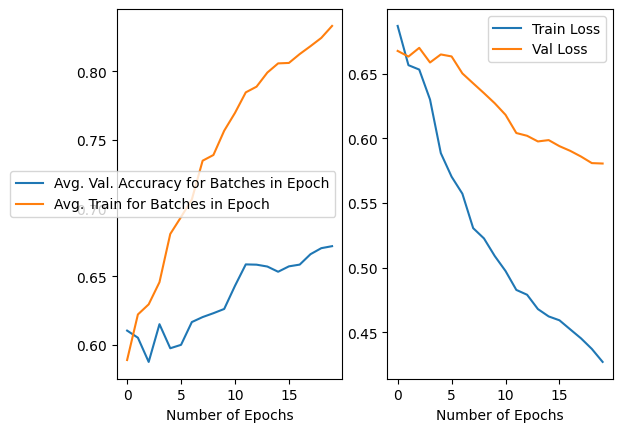

(0.672187508828938, 0.5805629)

In [ ]:
train(start_frozen=True, resnet='resnet152', model_unfreeze=0) # try changing 0 to different numbers

train loss:0.4759, train accuracy:0.6667.: 100%|██████████| 240/240 [03:57<00:00,  1.01it/s]


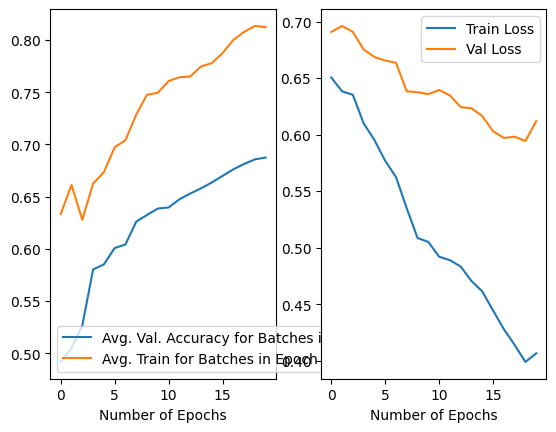

(0.6873958453536033, 0.61191785)

In [ ]:
train(start_frozen=True, resnet='resnet152', model_unfreeze=10)

train loss:0.2528, train accuracy:1.0000.: 100%|██████████| 240/240 [02:31<00:00,  1.58it/s]


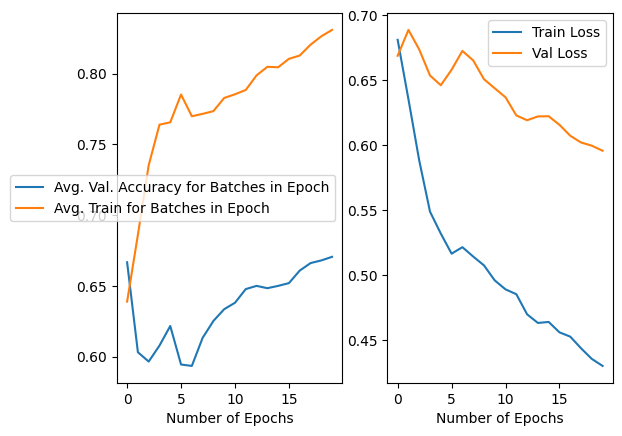

(0.6705208413302899, 0.5956445)

In [ ]:
train(start_frozen=True, resnet='resnet50', weight=ResNet50_Weights.DEFAULT, model_unfreeze=0) # try changing 0 to different numbers

train loss:0.1147, train accuracy:1.0000.: 100%|██████████| 240/240 [02:32<00:00,  1.58it/s]


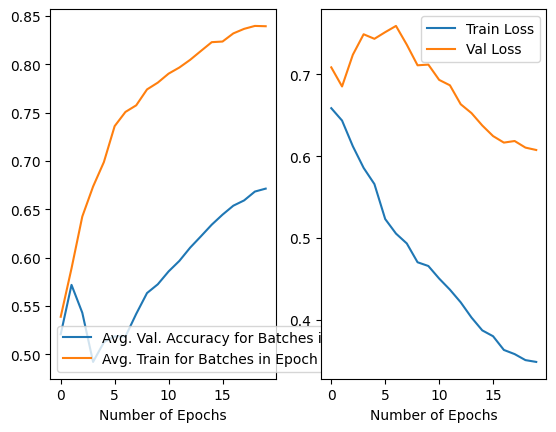

(0.6714583419263362, 0.6075322)

In [ ]:
train(start_frozen=True, resnet='resnet50', weight=ResNet50_Weights.DEFAULT, model_unfreeze=10)

train loss:7.6726, train accuracy:0.0000.: 100%|██████████| 240/240 [03:49<00:00,  1.05it/s]


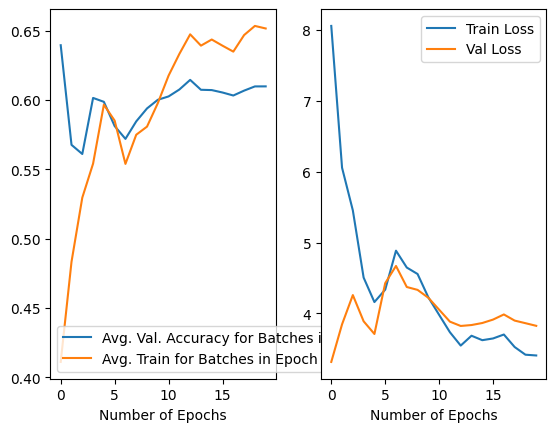

(0.609895846247673, 3.8254135)

In [ ]:
train(start_frozen=True, resnet='resnet152', model_unfreeze=0, weight=ResNet152_Weights.IMAGENET1K_V1)

train loss:0.0345, train accuracy:1.0000.: 100%|██████████| 240/240 [03:52<00:00,  1.03it/s]


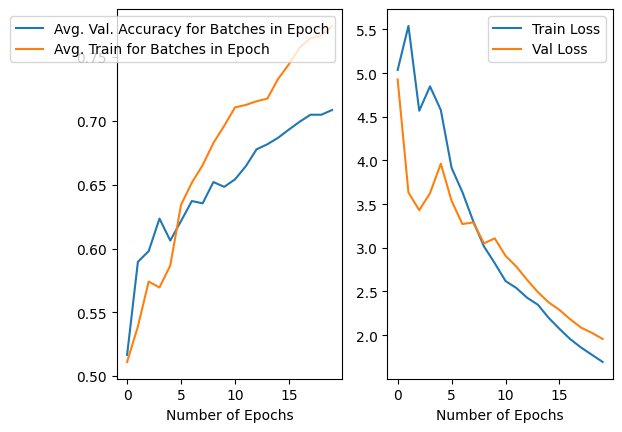

(0.708541676774621, 1.9566418)

In [ ]:
train(start_frozen=True, resnet='resnet152', model_unfreeze=10, weight=ResNet152_Weights.IMAGENET1K_V1)

In [ ]:
'''from torch.nn.modules.loss import CrossEntropyLoss
learning_rates = [.04, .05, .06, .07, .08, .09, .1, .11, .12]
batch_sizes = [5, 6, 7, 8, 9]
optimizers = [optim.Adam, optim.SGD]
loss_function = [nn.CrossEntropyLoss()]
pretrained_weights = [ResNet152_Weights.IMAGENET1K_V1, ResNet152_Weights.IMAGENET1K_V2]
epoch_sizes = [10, 15, 20, 25, 30]

tol = .7

for num_epoch in epoch_sizes:
  for pretrain in pretrained_weights:
    new_tol = train(num_epoches=num_epoch, weights=pretrain)[0]
    new_tol.to(device)
    torch.cuda.empty_cache()

    if new_tol > tol:
      print("Num Epochs: ", num_epoch)
      best_epoch = num_epoch
      print("Weights Used: ", pretrain)
      best_weights = pretrain

      tol = new_tol


print("Num Epochs: ", best_epoch)
print("Weights Used: ", best_weights)
print("Best accuracy: ", new_tol)'''

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


OutOfMemoryError: ignored

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 120MB/s]
train loss:1.7443, train accuracy:0.3333.: 100%|██████████| 240/240 [02:29<00:00,  1.61it/s]


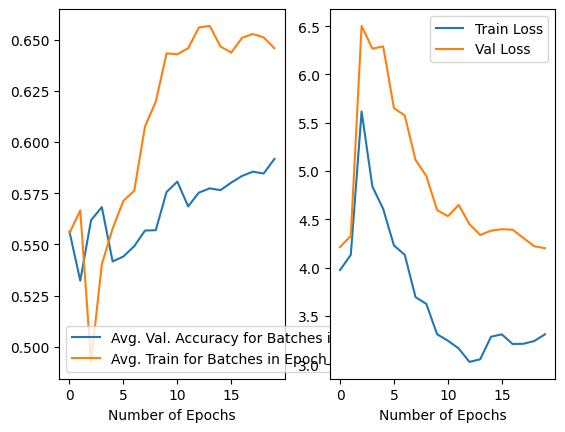

(0.5917708393186331, 4.201638)

In [ ]:
train(start_frozen=True, resnet='resnet50', model_unfreeze=0, weight=ResNet50_Weights.IMAGENET1K_V1)

0 last layer(s) unfrozen





  0%|          | 0/240 [00:00<?, ?it/s]


train loss:0.6770, train accuracy:0.6000.:   0%|          | 0/240 [00:02<?, ?it/s]


train loss:0.6770, train accuracy:0.6000.:   0%|          | 1/240 [00:02<10:34,  2.66s/it]


train loss:0.6424, train accuracy:0.6000.:   0%|          | 1/240 [00:02<10:34,  2.66s/it]


train loss:0.6424, train accuracy:0.6000.:   1%|          | 2/240 [00:02<04:58,  1.26s/it]


train loss:0.7338, train accuracy:0.4000.:   1%|          | 2/240 [00:03<04:58,  1.26s/it]


train loss:0.7338, train accuracy:0.4000.:   1%|▏         | 3/240 [00:03<03:10,  1.24it/s]


train loss:0.6084, train accuracy:0.8000.:   1%|▏         | 3/240 [00:05<03:10,  1.24it/s]


train loss:0.6084, train accuracy:0.8000.:   2%|▏         | 4/240 [00:05<05:22,  1.37s/it]


train loss:0.8841, train accuracy:0.0000.:   2%|▏         | 4/240 [00:05<05:22,  1.37s/it]


train loss:0.8841, train accuracy:0.0000.:   2%|▏         | 5/240 [00:05<03:52,  1.01it/s]


train loss:0.5819, train accuracy

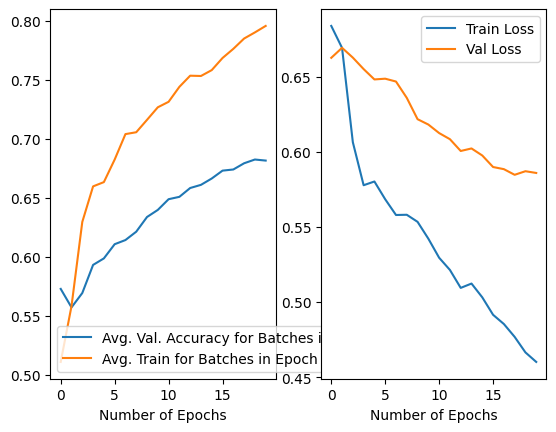

0.6815625105053187 0.5859618
1 last layer(s) unfrozen





  0%|          | 0/240 [00:00<?, ?it/s]


train loss:0.6784, train accuracy:0.8000.:   0%|          | 0/240 [00:02<?, ?it/s]


train loss:0.6784, train accuracy:0.8000.:   0%|          | 1/240 [00:02<10:28,  2.63s/it]


train loss:0.9820, train accuracy:0.4000.:   0%|          | 1/240 [00:02<10:28,  2.63s/it]


train loss:0.9820, train accuracy:0.4000.:   1%|          | 2/240 [00:02<04:56,  1.25s/it]


train loss:0.5638, train accuracy:0.8000.:   1%|          | 2/240 [00:03<04:56,  1.25s/it]


train loss:0.5638, train accuracy:0.8000.:   1%|▏         | 3/240 [00:03<03:10,  1.25it/s]


train loss:0.6972, train accuracy:0.6000.:   1%|▏         | 3/240 [00:05<03:10,  1.25it/s]


train loss:0.6972, train accuracy:0.6000.:   2%|▏         | 4/240 [00:05<05:12,  1.33s/it]


train loss:0.5389, train accuracy:0.8000.:   2%|▏         | 4/240 [00:05<05:12,  1.33s/it]


train loss:0.5389, train accuracy:0.8000.:   2%|▏         | 5/240 [00:05<03:43,  1.05it/s]


train loss:0.4691, train accuracy

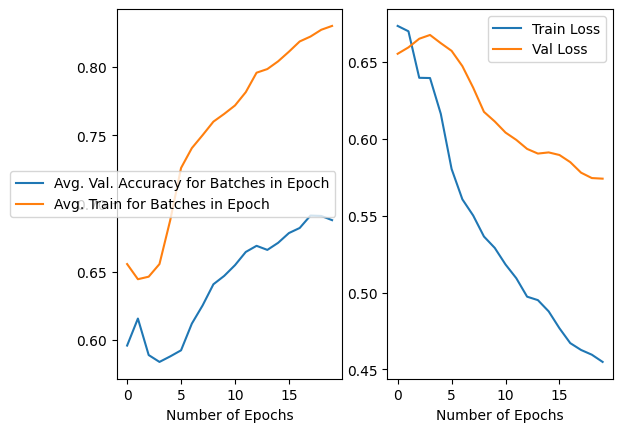

0.6877083424478769 0.5739883
2 last layer(s) unfrozen


train loss:0.3135, train accuracy:1.0000.: 100%|██████████| 240/240 [03:50<00:00,  1.04it/s]


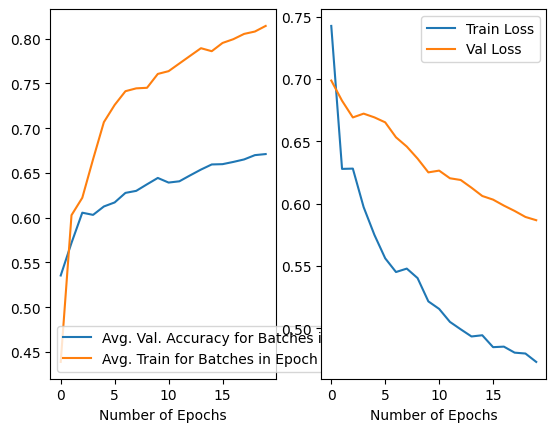

0.6710416782647372 0.58668333
3 last layer(s) unfrozen


train loss:0.3648, train accuracy:0.6667.: 100%|██████████| 240/240 [03:51<00:00,  1.04it/s]


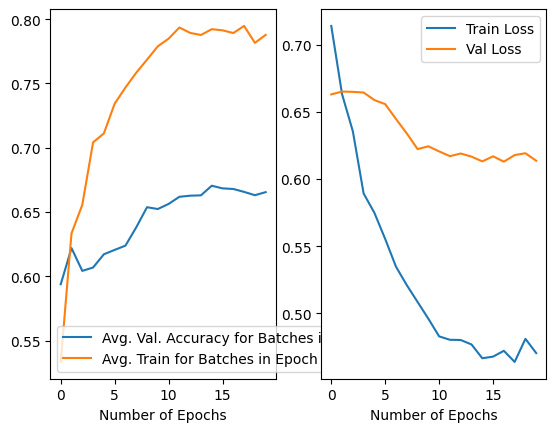

0.6654166728258133 0.61356056
4 last layer(s) unfrozen


train loss:1.2629, train accuracy:0.3333.: 100%|██████████| 240/240 [03:53<00:00,  1.03it/s]


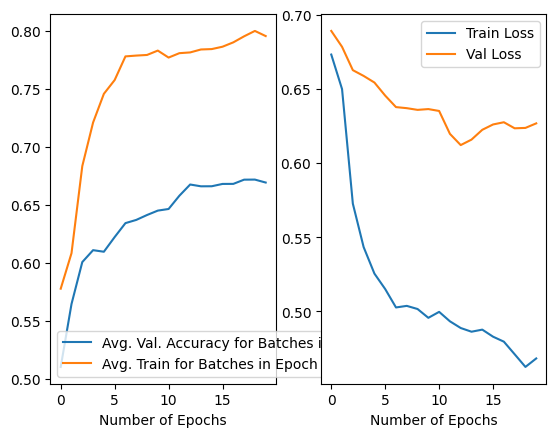

0.6691666681319475 0.6267284
5 last layer(s) unfrozen


train loss:0.4653, train accuracy:1.0000.: 100%|██████████| 240/240 [03:53<00:00,  1.03it/s]


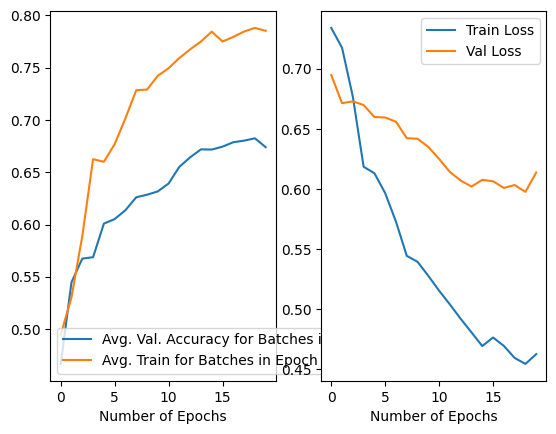

0.6739583410322666 0.6137848
6 last layer(s) unfrozen


train loss:0.1796, train accuracy:1.0000.: 100%|██████████| 240/240 [03:54<00:00,  1.02it/s]


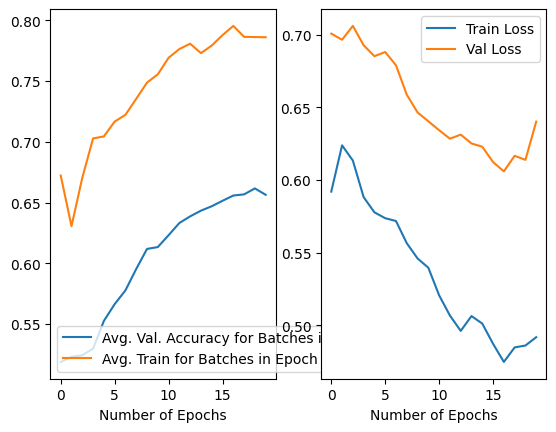

0.6563541747629642 0.6402317
7 last layer(s) unfrozen


train loss:0.0085, train accuracy:1.0000.: 100%|██████████| 240/240 [03:53<00:00,  1.03it/s]


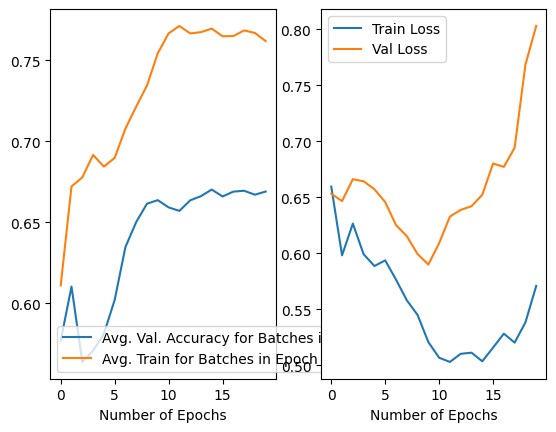

0.6690625056624413 0.8029747
8 last layer(s) unfrozen


train loss:0.3311, train accuracy:0.6667.: 100%|██████████| 240/240 [03:54<00:00,  1.02it/s]


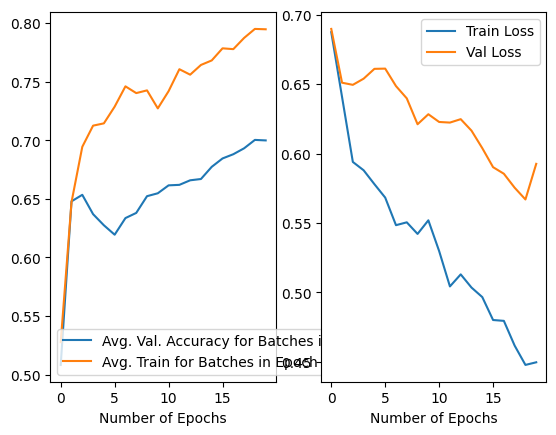

0.6998958475887775 0.59257036
9 last layer(s) unfrozen


train loss:0.1471, train accuracy:1.0000.: 100%|██████████| 240/240 [03:55<00:00,  1.02it/s]


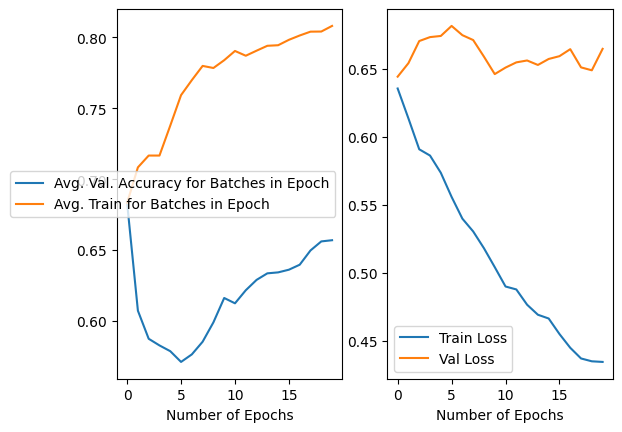

0.6569791715592146 0.6644392
10 last layer(s) unfrozen


train loss:0.2630, train accuracy:1.0000.: 100%|██████████| 240/240 [03:56<00:00,  1.01it/s]


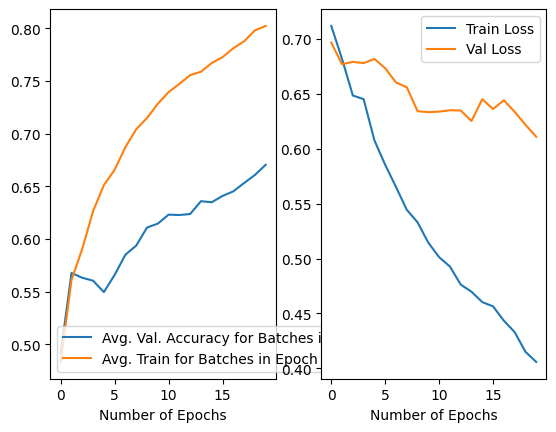

0.670416671410203 0.61076707
11 last layer(s) unfrozen


train loss:0.0248, train accuracy:1.0000.: 100%|██████████| 240/240 [03:54<00:00,  1.02it/s]


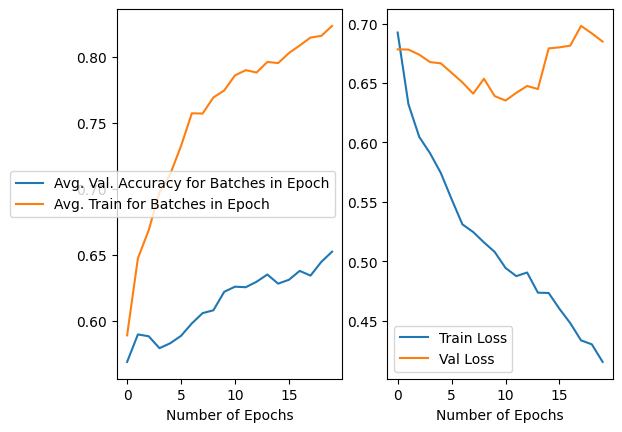

0.652291676402092 0.68482745
12 last layer(s) unfrozen


train loss:0.0338, train accuracy:1.0000.: 100%|██████████| 240/240 [03:55<00:00,  1.02it/s]


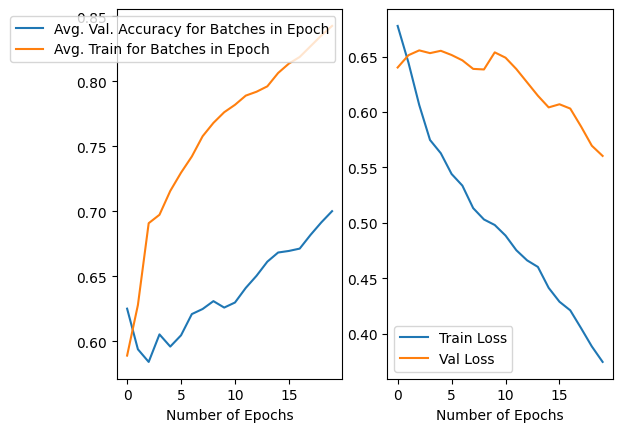

0.7000000115484 0.5603846
13 last layer(s) unfrozen


train loss:0.7032, train accuracy:0.3333.: 100%|██████████| 240/240 [03:57<00:00,  1.01it/s]


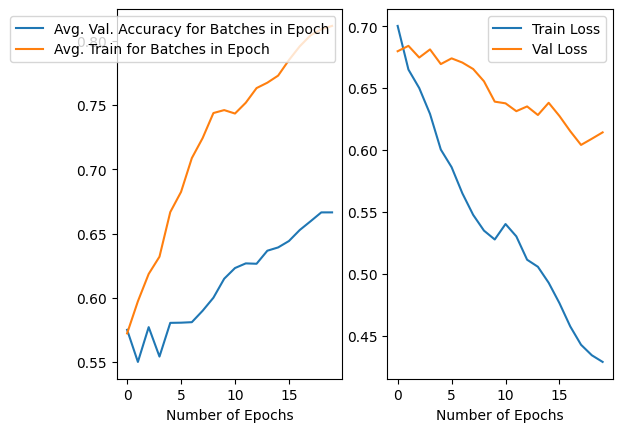

0.6664583411067724 0.6142544
14 last layer(s) unfrozen


train loss:0.3192, train accuracy:1.0000.: 100%|██████████| 240/240 [03:58<00:00,  1.01it/s]


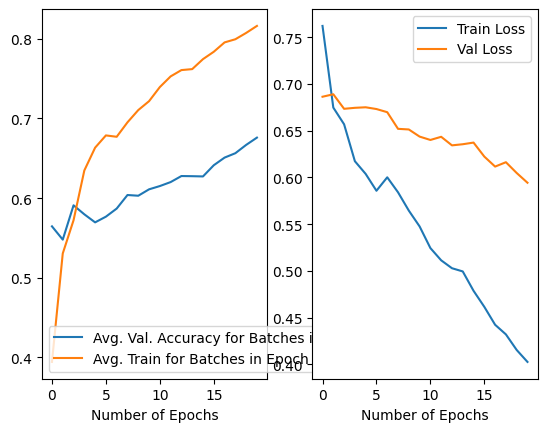

0.675937508046627 0.59428054
15 last layer(s) unfrozen


train loss:0.3129, train accuracy:1.0000.: 100%|██████████| 240/240 [03:58<00:00,  1.01it/s]


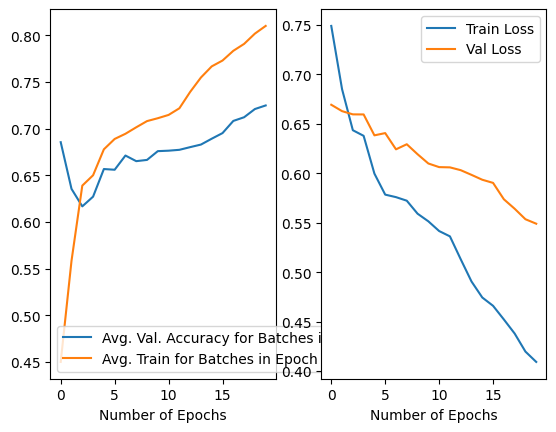

0.7247916687279939 0.54907054
16 last layer(s) unfrozen


train loss:0.2086, train accuracy:1.0000.: 100%|██████████| 240/240 [03:58<00:00,  1.01it/s]


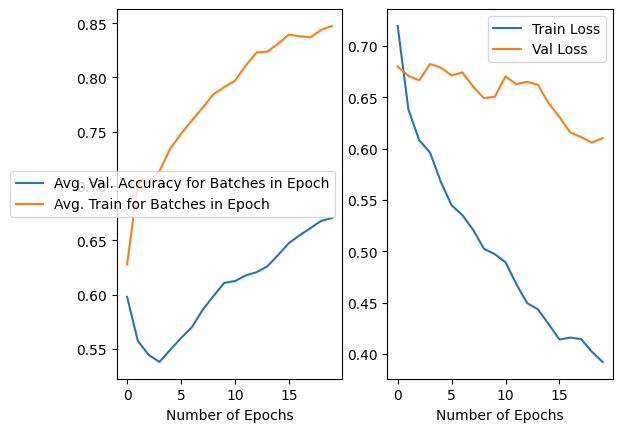

0.6705208349972963 0.6101357
17 last layer(s) unfrozen


train loss:0.2661, train accuracy:0.6667.: 100%|██████████| 240/240 [03:58<00:00,  1.01it/s]


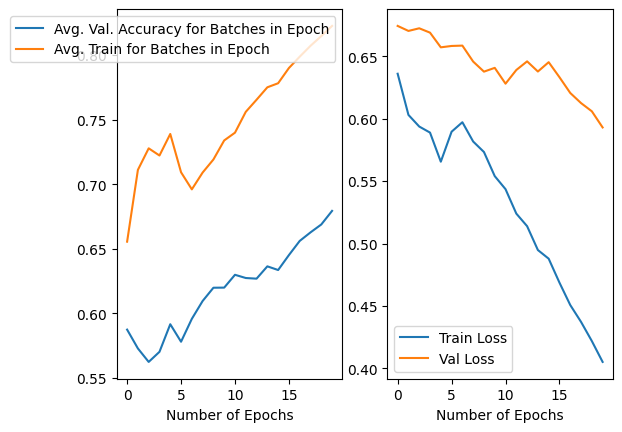

0.6793750070035458 0.5929607
18 last layer(s) unfrozen


train loss:0.1223, train accuracy:1.0000.: 100%|██████████| 240/240 [03:59<00:00,  1.00it/s]


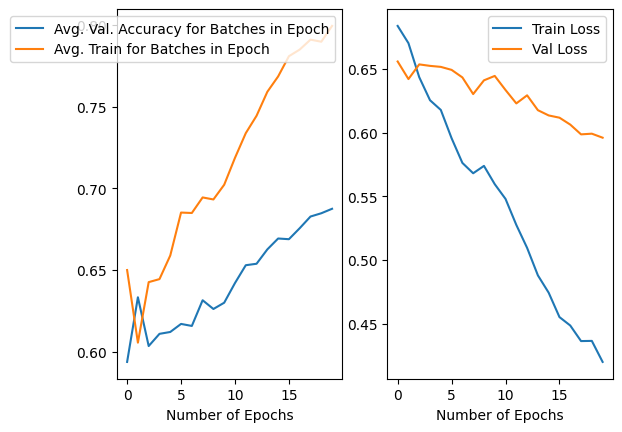

0.6875000156462192 0.59609824
19 last layer(s) unfrozen


train loss:0.4563, train accuracy:1.0000.: 100%|██████████| 240/240 [03:59<00:00,  1.00it/s]


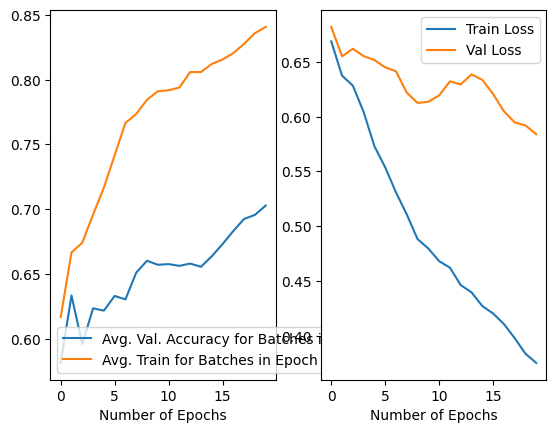

0.7028125075623393 0.5839528
20 last layer(s) unfrozen


train loss:0.7637, train accuracy:0.3333.: 100%|██████████| 240/240 [03:59<00:00,  1.00it/s]


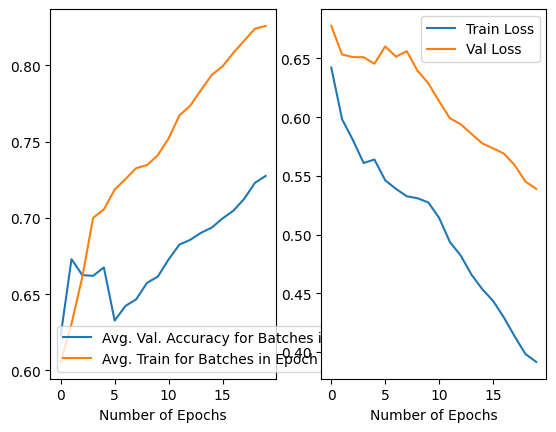

0.7274999994784593 0.5389649


In [ ]:
unfreeze_layers = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
weights = [ResNet152_Weights.DEFAULT, ResNet152_Weights.IMAGENET1K_V1, ResNet152_Weights.IMAGENET1K_V2]
for layer in unfreeze_layers:
  print(layer, 'last layer(s) unfrozen')
  train(start_frozen=True, resnet='resnet152', model_unfreeze=layer, weight=ResNet152_Weights.DEFAULT)


0 last layer(s) unfrozen


train loss:8.1106, train accuracy:0.3333.: 100%|██████████| 240/240 [04:00<00:00,  1.00s/it]


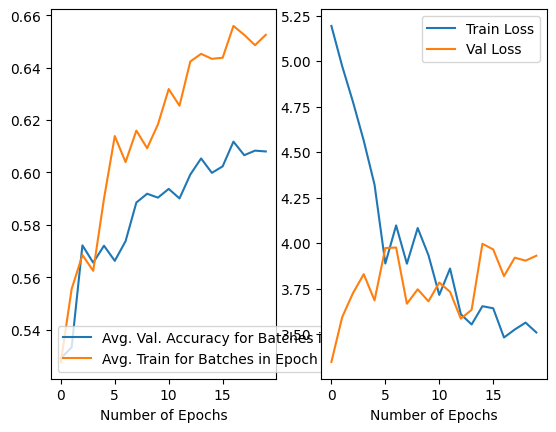

0.6080208469182253 3.9304595
1 last layer(s) unfrozen


train loss:0.0107, train accuracy:1.0000.: 100%|██████████| 240/240 [03:59<00:00,  1.00it/s]


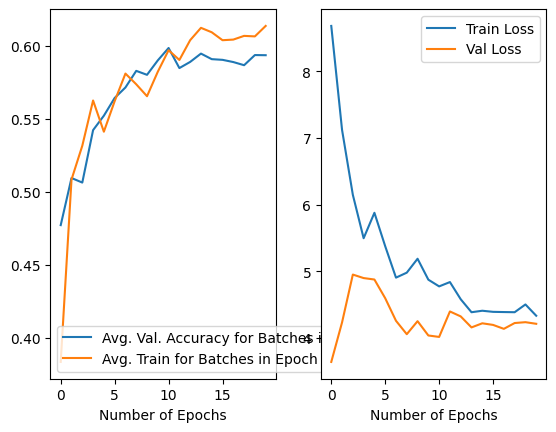

0.5935416746884584 4.2141967
2 last layer(s) unfrozen


train loss:0.4826, train accuracy:0.3333.: 100%|██████████| 240/240 [03:59<00:00,  1.00it/s]


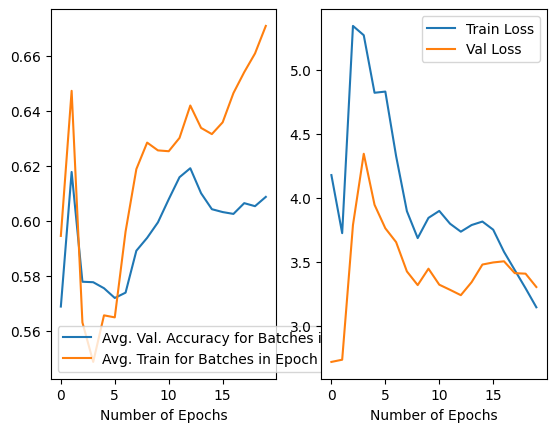

0.6086458418518305 3.303002
3 last layer(s) unfrozen


train loss:0.1598, train accuracy:1.0000.: 100%|██████████| 240/240 [03:59<00:00,  1.00it/s]


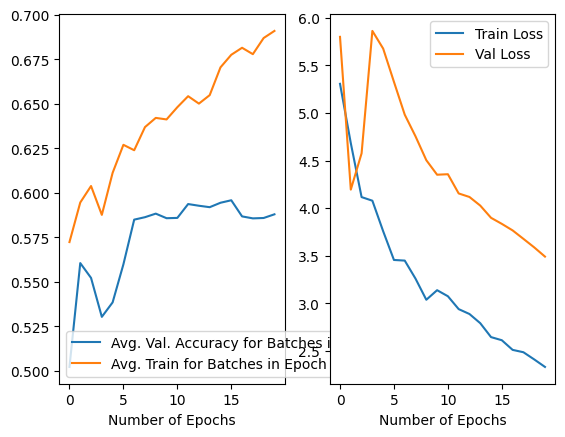

0.5878125075250864 3.489875
4 last layer(s) unfrozen


train loss:0.0436, train accuracy:1.0000.: 100%|██████████| 240/240 [03:59<00:00,  1.00it/s]


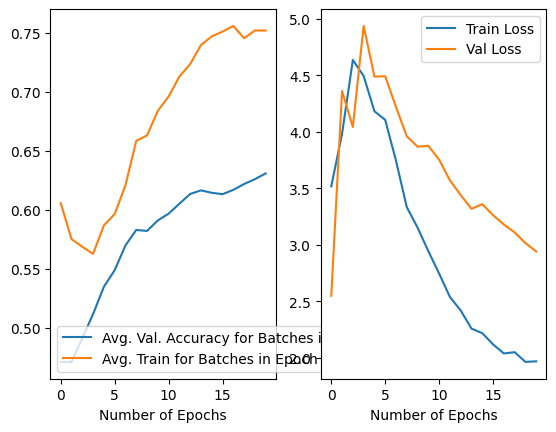

0.6307291708886623 2.9398189
5 last layer(s) unfrozen


train loss:0.0004, train accuracy:1.0000.: 100%|██████████| 240/240 [04:00<00:00,  1.00s/it]


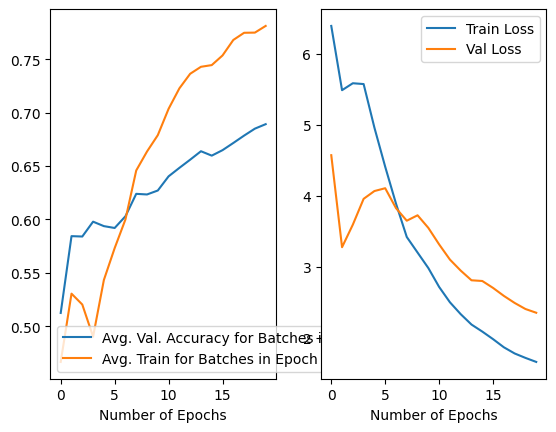

0.6891666751354932 2.353162
6 last layer(s) unfrozen


train loss:0.0003, train accuracy:1.0000.: 100%|██████████| 240/240 [04:00<00:00,  1.00s/it]


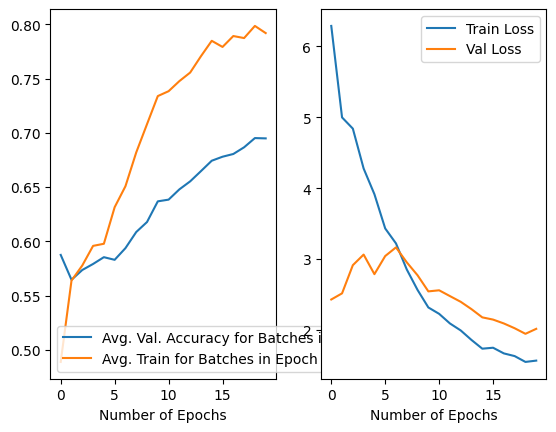

0.6948958430439234 2.017479
7 last layer(s) unfrozen


train loss:1.2544, train accuracy:0.6667.: 100%|██████████| 240/240 [04:01<00:00,  1.00s/it]


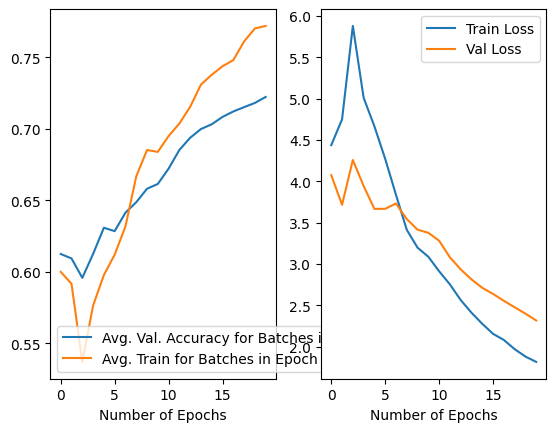

0.722291673719883 2.316652
8 last layer(s) unfrozen


train loss:0.0156, train accuracy:1.0000.: 100%|██████████| 240/240 [04:01<00:00,  1.01s/it]


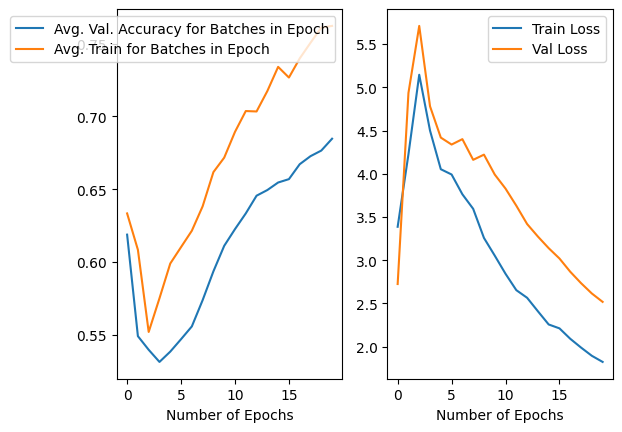

0.6846875078976155 2.5178523
9 last layer(s) unfrozen


train loss:0.0333, train accuracy:1.0000.: 100%|██████████| 240/240 [04:01<00:00,  1.01s/it]


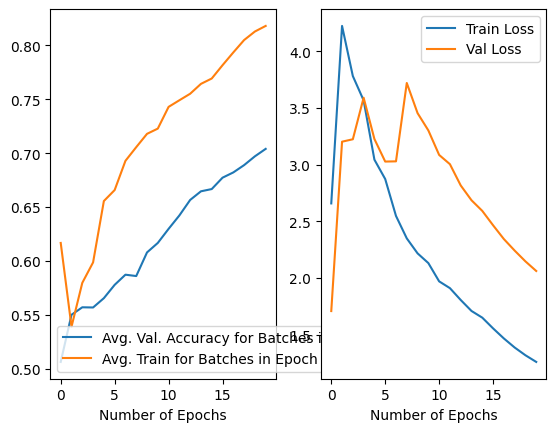

0.7039583444595336 2.0629218
10 last layer(s) unfrozen


train loss:0.0013, train accuracy:1.0000.: 100%|██████████| 240/240 [04:03<00:00,  1.02s/it]


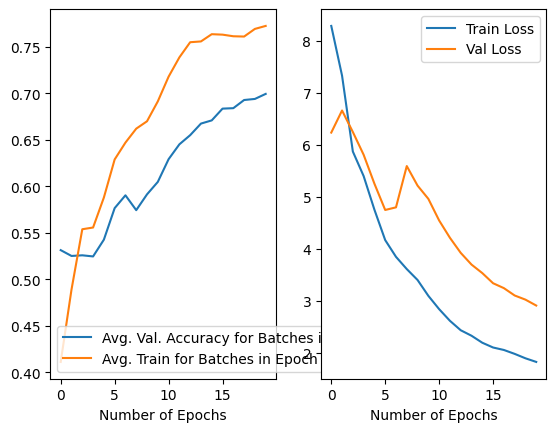

0.6991666724905372 2.9097562
11 last layer(s) unfrozen


train loss:0.0798, train accuracy:1.0000.: 100%|██████████| 240/240 [04:01<00:00,  1.01s/it]


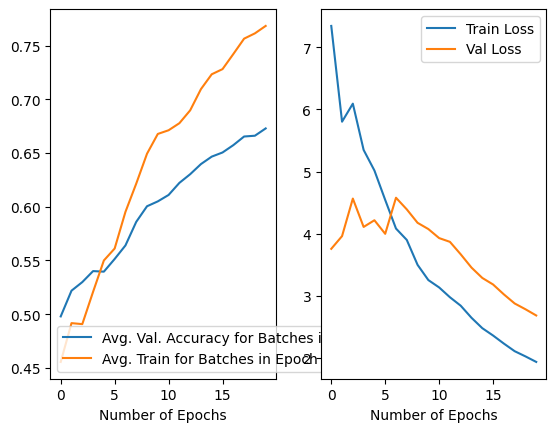

0.6729166679084301 2.6854832
12 last layer(s) unfrozen


train loss:0.0100, train accuracy:1.0000.: 100%|██████████| 240/240 [04:03<00:00,  1.01s/it]


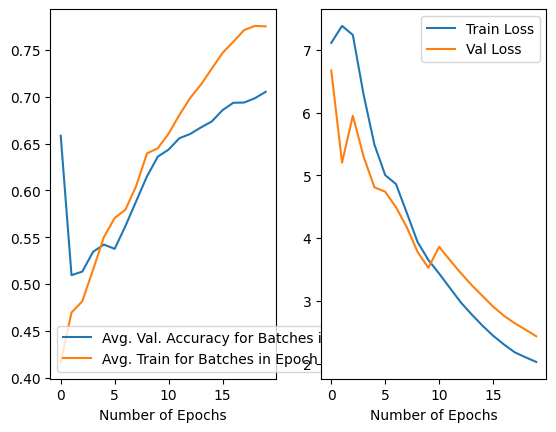

0.705312505364418 2.435318
13 last layer(s) unfrozen


train loss:0.4398, train accuracy:0.6667.: 100%|██████████| 240/240 [04:03<00:00,  1.01s/it]


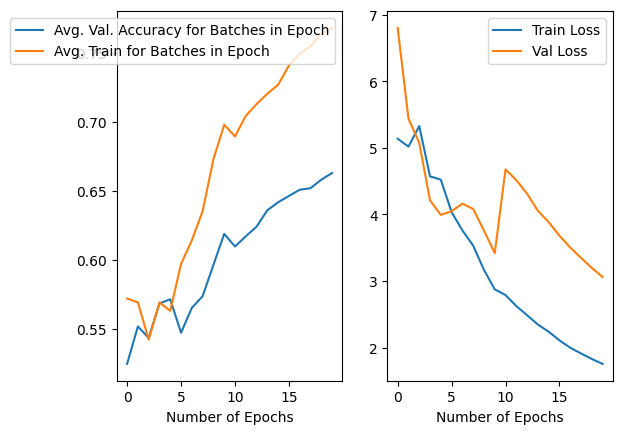

0.6629166770726442 3.0605633
14 last layer(s) unfrozen


train loss:0.0077, train accuracy:1.0000.: 100%|██████████| 240/240 [04:04<00:00,  1.02s/it]


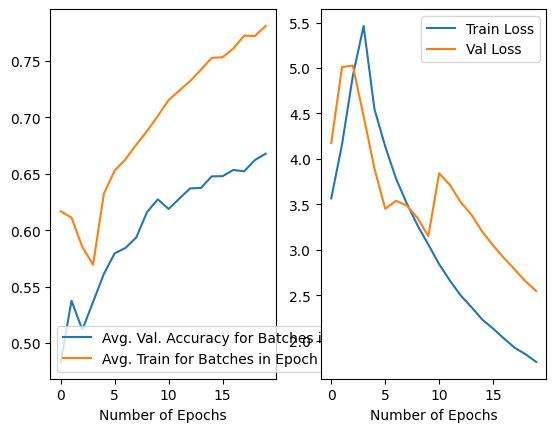

0.6677083408460021 2.5459065
15 last layer(s) unfrozen


train loss:0.0124, train accuracy:1.0000.: 100%|██████████| 240/240 [04:02<00:00,  1.01s/it]


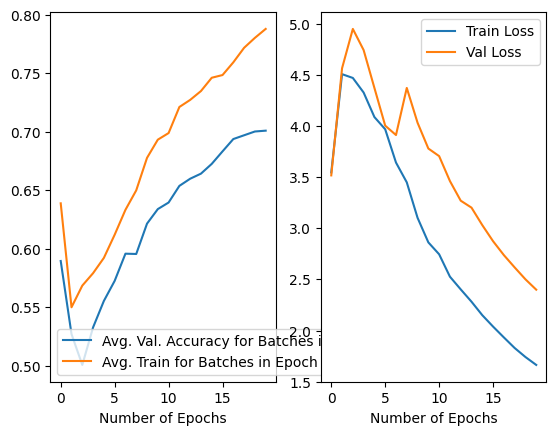

0.7010416742414236 2.39948
16 last layer(s) unfrozen


train loss:0.0079, train accuracy:1.0000.: 100%|██████████| 240/240 [04:02<00:00,  1.01s/it]


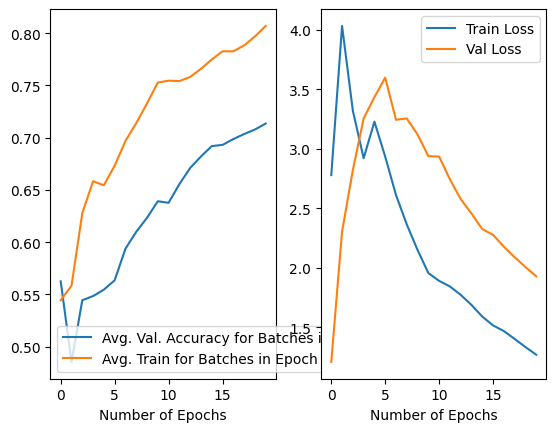

0.7135416731238365 1.9296606
17 last layer(s) unfrozen


train loss:0.0875, train accuracy:1.0000.: 100%|██████████| 240/240 [04:03<00:00,  1.01s/it]


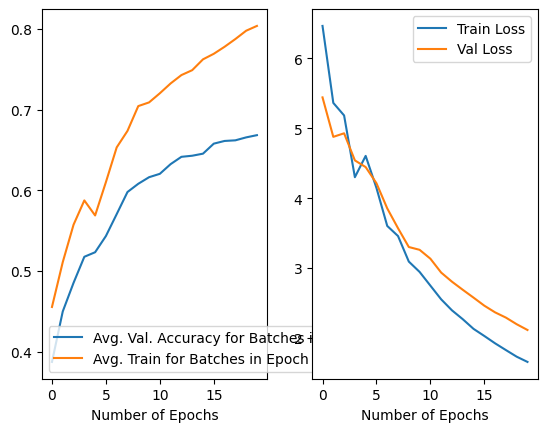

0.6683333352208137 2.1151068
18 last layer(s) unfrozen


train loss:0.0228, train accuracy:1.0000.: 100%|██████████| 240/240 [04:05<00:00,  1.02s/it]


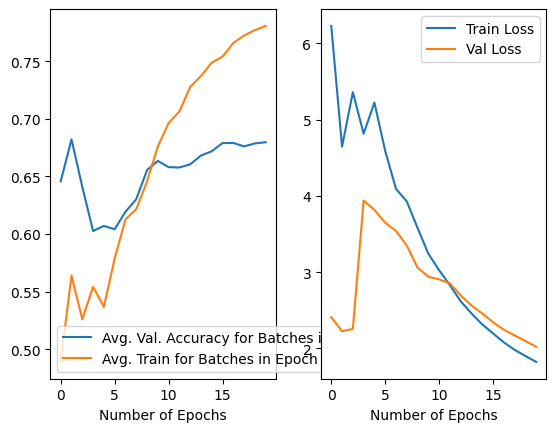

0.679791672155261 2.022201
19 last layer(s) unfrozen


train loss:0.5580, train accuracy:0.6667.: 100%|██████████| 240/240 [04:04<00:00,  1.02s/it]


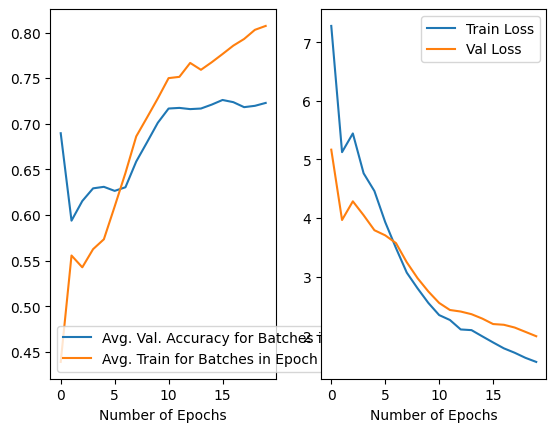

0.7228125071153044 1.9833912
20 last layer(s) unfrozen


train loss:0.0225, train accuracy:1.0000.: 100%|██████████| 240/240 [04:04<00:00,  1.02s/it]


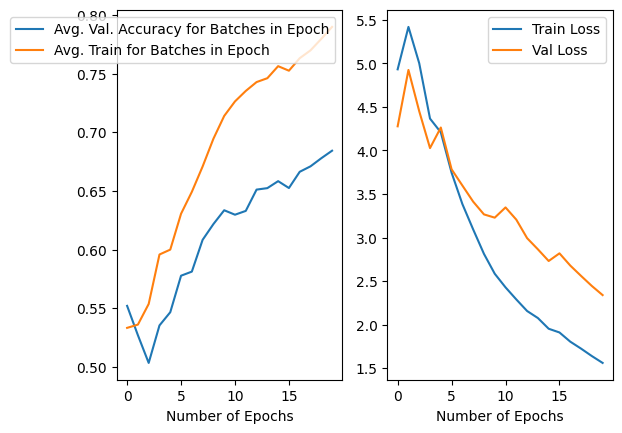

0.6842708412557841 2.338702


In [ ]:
unfreeze_layers = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
weights = [ResNet152_Weights.DEFAULT, ResNet152_Weights.IMAGENET1K_V1, ResNet152_Weights.IMAGENET1K_V2]
for layer in unfreeze_layers:
  print(layer, 'last layer(s) unfrozen')
  train(start_frozen=True, resnet='resnet152', model_unfreeze=layer, weight=ResNet152_Weights.IMAGENET1K_V1)

0 last layer(s) unfrozen


train loss:0.2574, train accuracy:1.0000.: 100%|██████████| 240/240 [04:20<00:00,  1.09s/it]


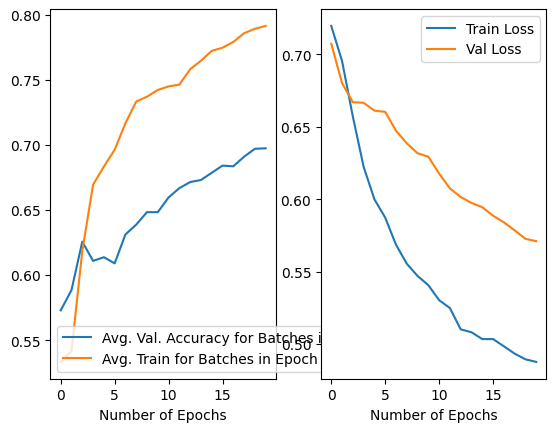

0.6973958410322666 0.57106876
1 last layer(s) unfrozen


train loss:0.1710, train accuracy:1.0000.: 100%|██████████| 240/240 [04:17<00:00,  1.07s/it]


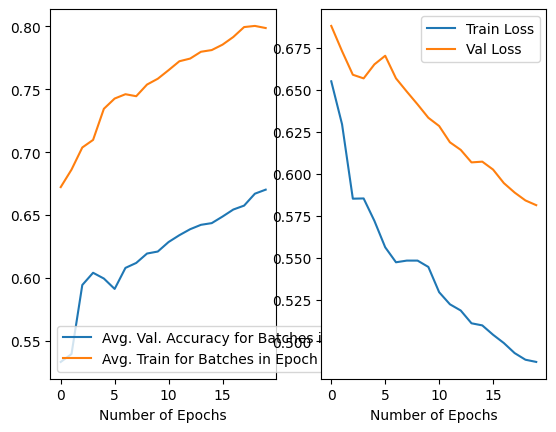

0.6702083423733711 0.5812475
2 last layer(s) unfrozen


train loss:0.3261, train accuracy:1.0000.: 100%|██████████| 240/240 [04:06<00:00,  1.03s/it]


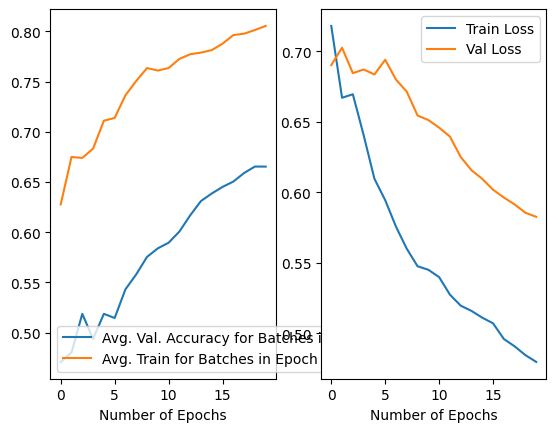

0.6654166704043746 0.58256716
3 last layer(s) unfrozen


train loss:0.2328, train accuracy:1.0000.: 100%|██████████| 240/240 [04:09<00:00,  1.04s/it]


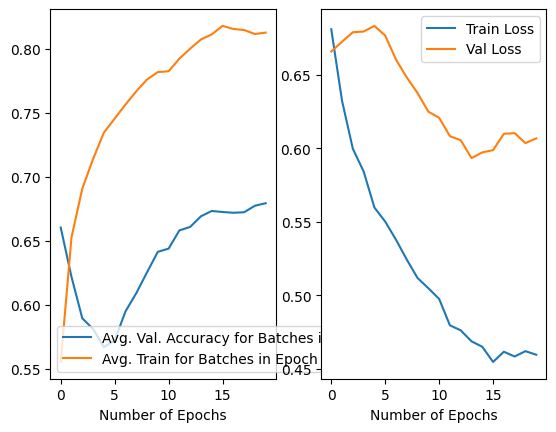

0.6793750066310167 0.60674953
4 last layer(s) unfrozen


train loss:0.9909, train accuracy:0.6667.: 100%|██████████| 240/240 [04:09<00:00,  1.04s/it]


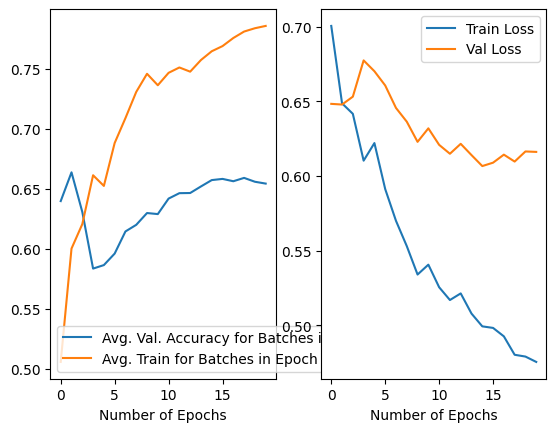

0.65416667945683 0.6161056
5 last layer(s) unfrozen


train loss:0.3748, train accuracy:0.6667.: 100%|██████████| 240/240 [04:14<00:00,  1.06s/it]


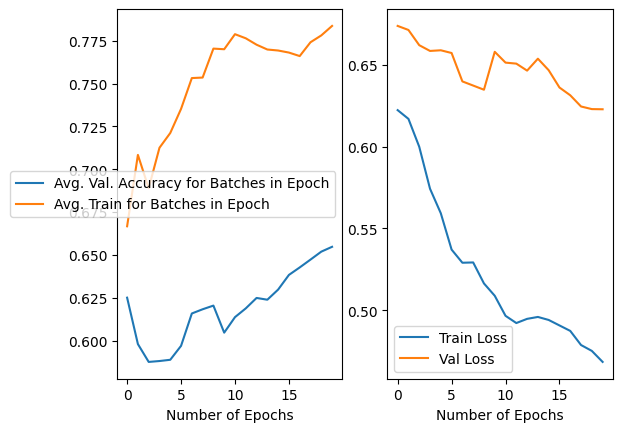

0.6546875055879354 0.62285995
6 last layer(s) unfrozen


train loss:0.0545, train accuracy:1.0000.: 100%|██████████| 240/240 [04:11<00:00,  1.05s/it]


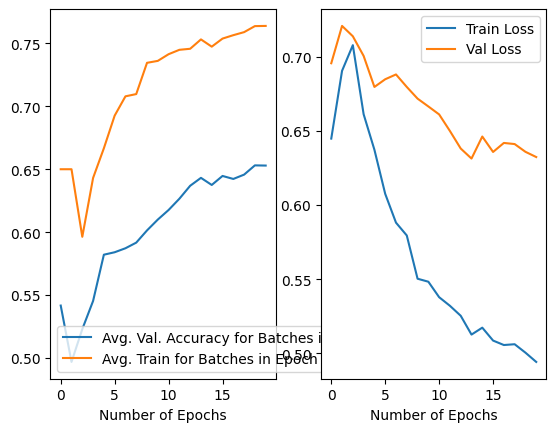

0.6529166709631682 0.6324166
7 last layer(s) unfrozen


train loss:0.7088, train accuracy:0.6667.: 100%|██████████| 240/240 [04:11<00:00,  1.05s/it]


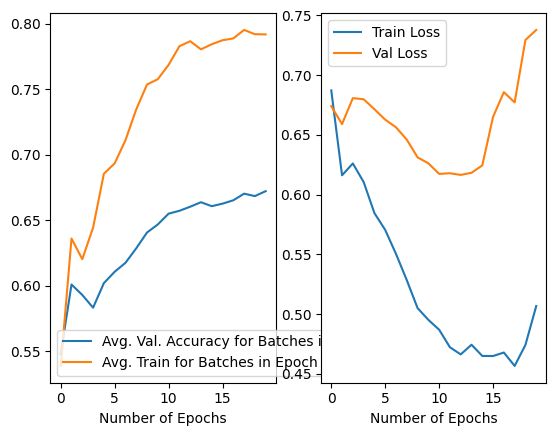

0.6722916711121798 0.7379247
8 last layer(s) unfrozen


train loss:0.0070, train accuracy:1.0000.: 100%|██████████| 240/240 [04:11<00:00,  1.05s/it]


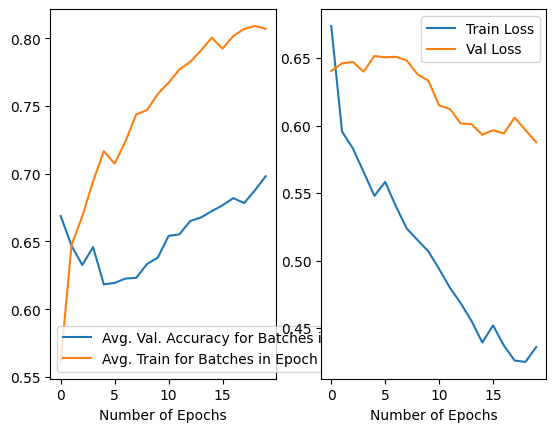

0.698125010356307 0.58764124
9 last layer(s) unfrozen


train loss:0.0197, train accuracy:1.0000.: 100%|██████████| 240/240 [04:11<00:00,  1.05s/it]


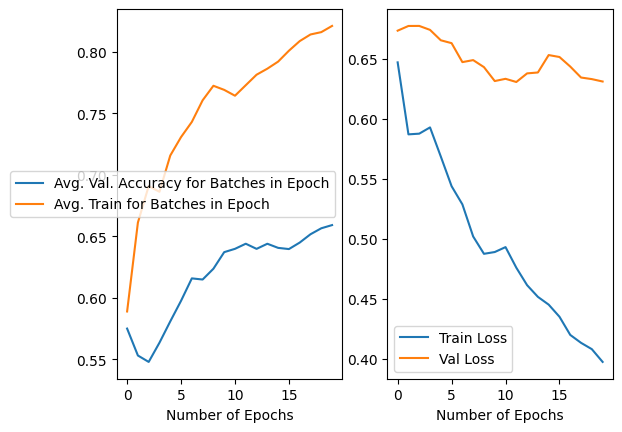

0.6590625032782554 0.6311549
10 last layer(s) unfrozen


train loss:1.1353, train accuracy:0.6667.: 100%|██████████| 240/240 [04:11<00:00,  1.05s/it]


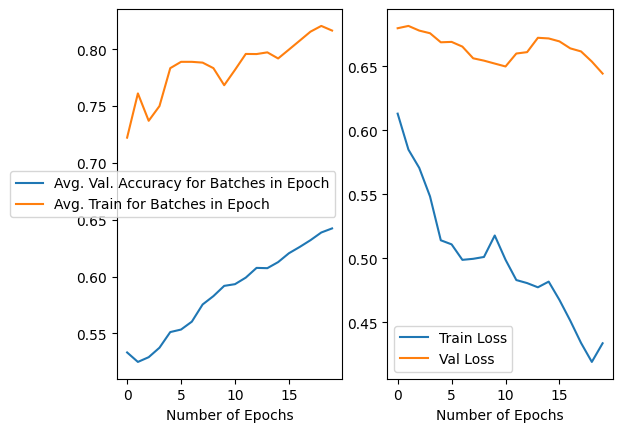

0.6423958372324705 0.64437515
11 last layer(s) unfrozen


train loss:1.7958, train accuracy:0.0000.: 100%|██████████| 240/240 [04:12<00:00,  1.05s/it]


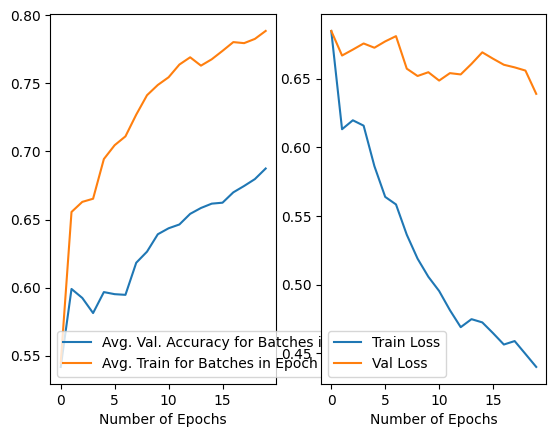

0.6875000100582838 0.6390791
12 last layer(s) unfrozen


train loss:0.0612, train accuracy:1.0000.: 100%|██████████| 240/240 [04:13<00:00,  1.05s/it]


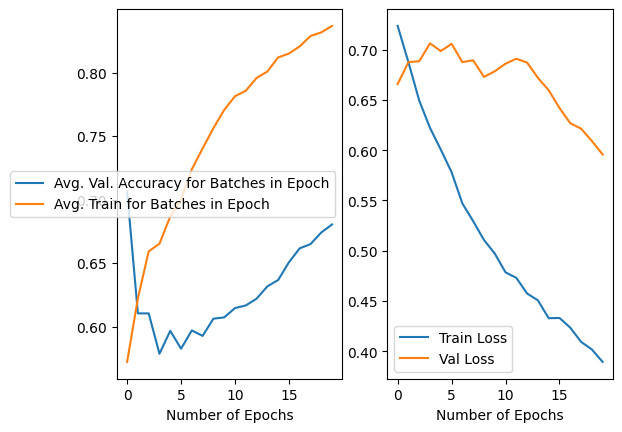

0.6804166708141566 0.5956771
13 last layer(s) unfrozen


train loss:0.2262, train accuracy:1.0000.: 100%|██████████| 240/240 [04:13<00:00,  1.06s/it]


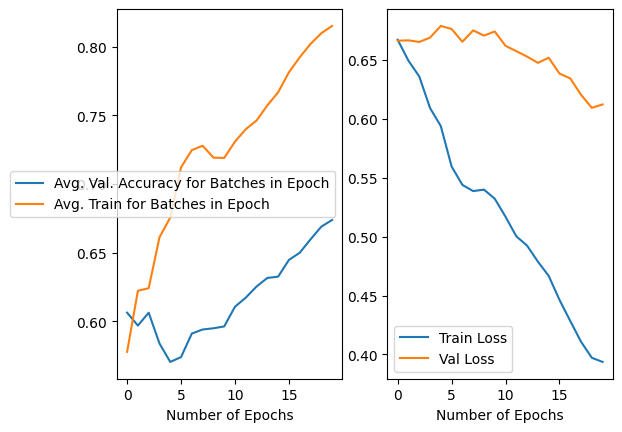

0.6737500078976154 0.6121359
14 last layer(s) unfrozen


train loss:1.1289, train accuracy:0.0000.: 100%|██████████| 240/240 [04:13<00:00,  1.05s/it]


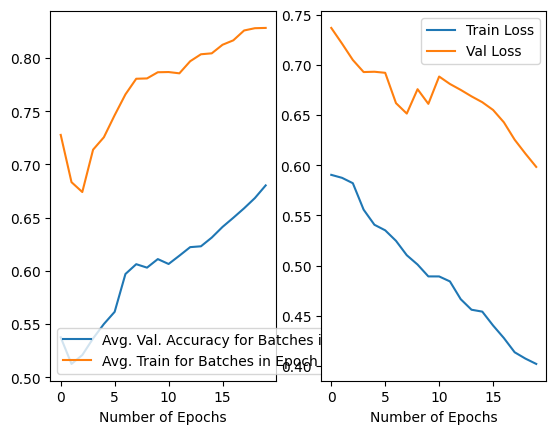

0.6803125090897083 0.59830725
15 last layer(s) unfrozen


train loss:0.2414, train accuracy:1.0000.: 100%|██████████| 240/240 [04:09<00:00,  1.04s/it]


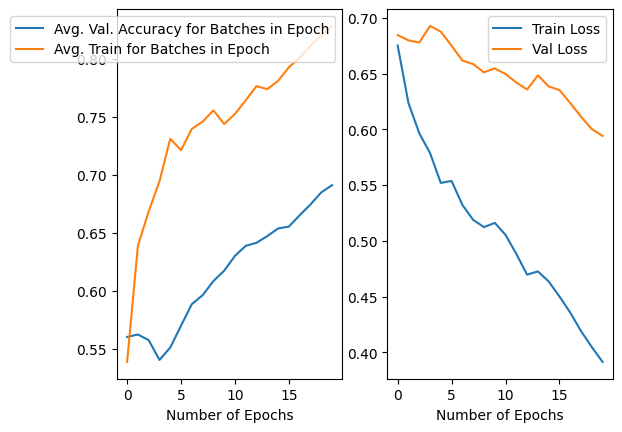

0.6911458399146795 0.5940946
16 last layer(s) unfrozen


train loss:0.0350, train accuracy:1.0000.: 100%|██████████| 240/240 [04:06<00:00,  1.03s/it]


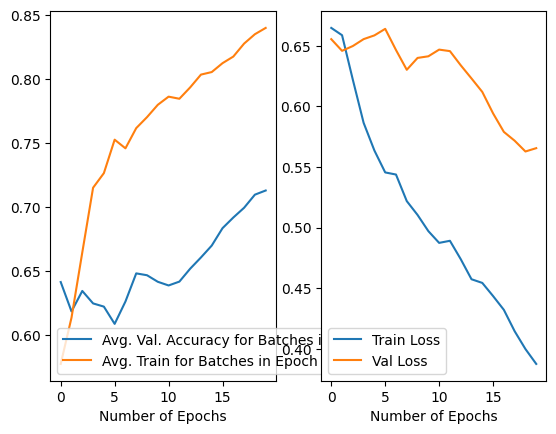

0.7131250094622373 0.5655098
17 last layer(s) unfrozen


train loss:0.2789, train accuracy:1.0000.: 100%|██████████| 240/240 [04:07<00:00,  1.03s/it]


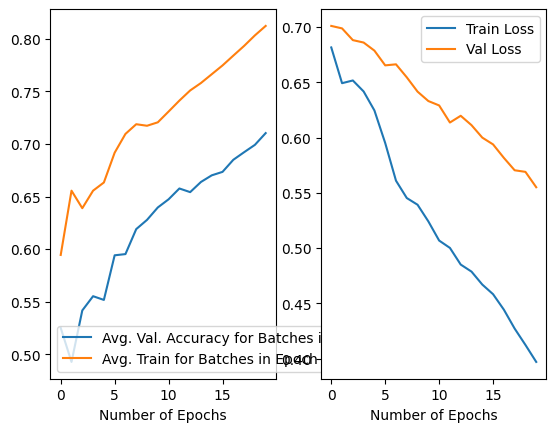

0.7103125061839819 0.5550526
18 last layer(s) unfrozen


train loss:0.5050, train accuracy:1.0000.: 100%|██████████| 240/240 [04:08<00:00,  1.04s/it]


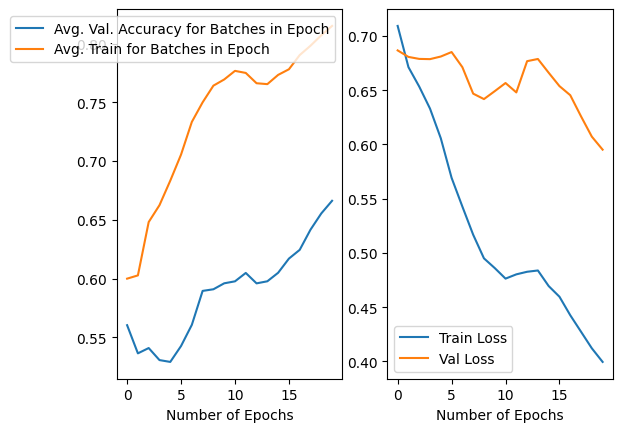

0.6662500081583858 0.5952436
19 last layer(s) unfrozen


train loss:0.3700, train accuracy:1.0000.:  38%|███▊      | 90/240 [01:32<01:57,  1.27it/s]

In [ ]:
unfreeze_layers = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
weights = [ResNet152_Weights.DEFAULT, ResNet152_Weights.IMAGENET1K_V1, ResNet152_Weights.IMAGENET1K_V2]
for layer in unfreeze_layers:
  print(layer, 'last layer(s) unfrozen')
  train(start_frozen=True, resnet='resnet152', model_unfreeze=layer, weight=ResNet152_Weights.IMAGENET1K_V2)

0 last layer(s) unfrozen


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 267MB/s]
train loss:0.2619, train accuracy:1.0000.: 100%|██████████| 240/240 [00:36<00:00,  6.50it/s]


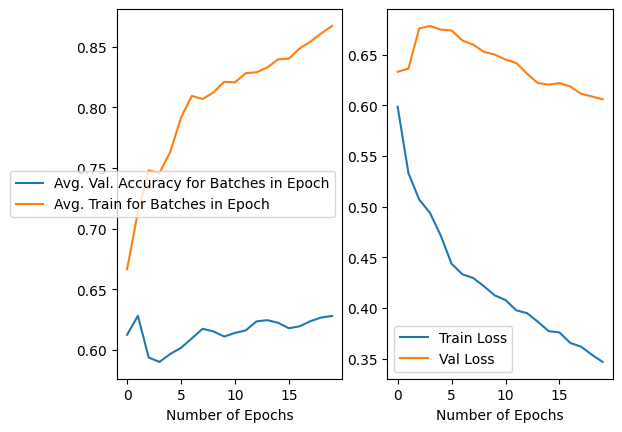

0.6280208393931389 0.6059062
1 last layer(s) unfrozen


train loss:0.2758, train accuracy:1.0000.: 100%|██████████| 240/240 [00:32<00:00,  7.47it/s]


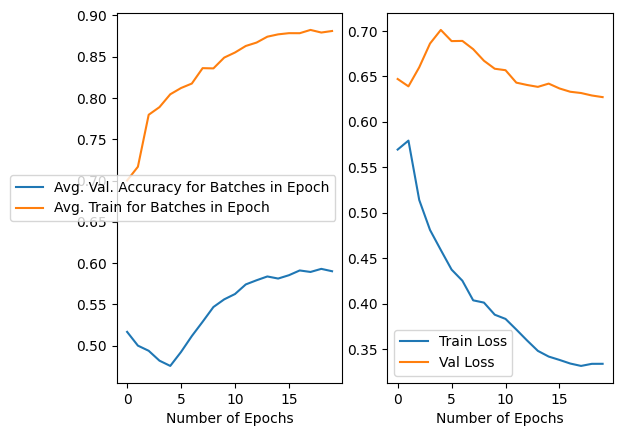

0.59010417945683 0.6272175
2 last layer(s) unfrozen


train loss:0.1670, train accuracy:1.0000.: 100%|██████████| 240/240 [00:31<00:00,  7.52it/s]


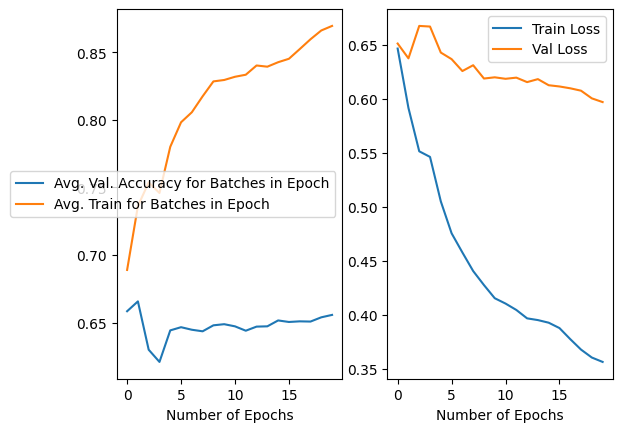

0.6556250032037496 0.59669524
3 last layer(s) unfrozen


train loss:0.6373, train accuracy:0.6667.: 100%|██████████| 240/240 [00:32<00:00,  7.28it/s]


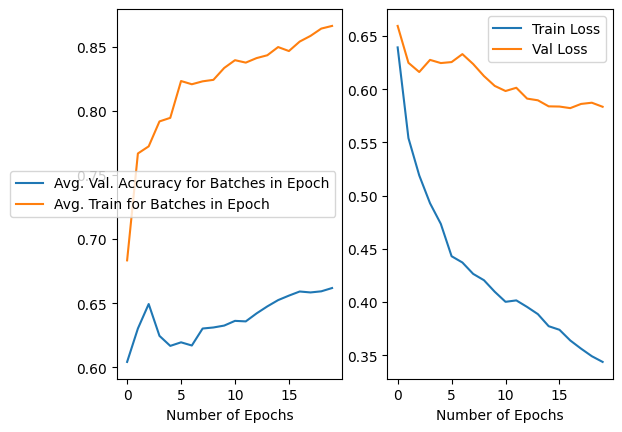

0.6617708340287208 0.5834727
4 last layer(s) unfrozen


train loss:0.0962, train accuracy:1.0000.: 100%|██████████| 240/240 [00:34<00:00,  6.99it/s]


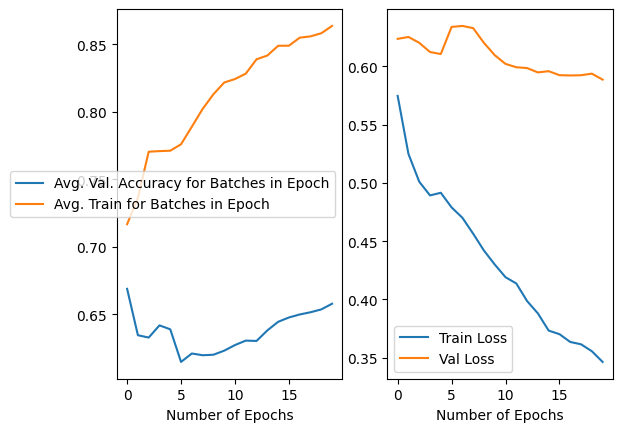

0.6577083434909582 0.58852684
5 last layer(s) unfrozen


train loss:0.1711, train accuracy:1.0000.: 100%|██████████| 240/240 [00:33<00:00,  7.15it/s]


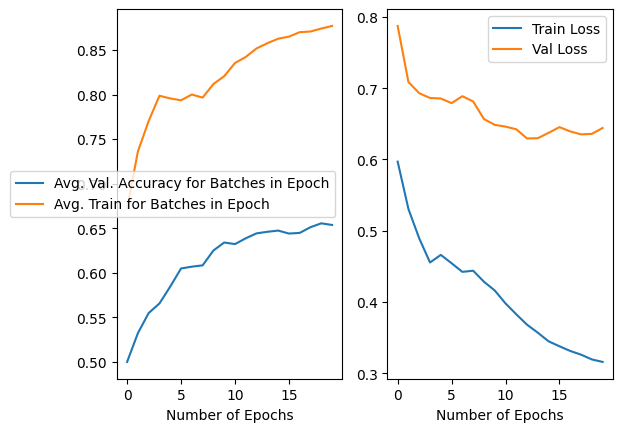

0.6536458414047956 0.64411175
6 last layer(s) unfrozen


train loss:0.5804, train accuracy:0.6667.: 100%|██████████| 240/240 [00:33<00:00,  7.18it/s]


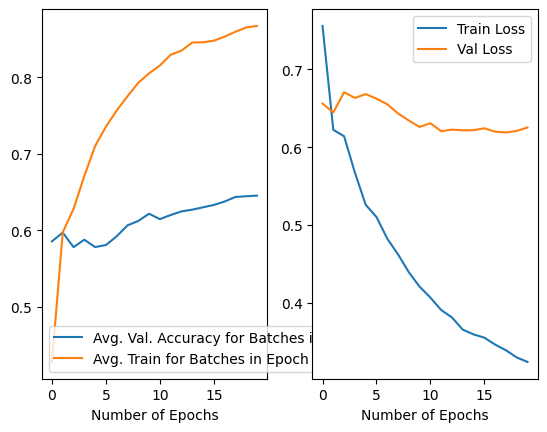

0.6451041713356972 0.6253338
7 last layer(s) unfrozen


train loss:0.0034, train accuracy:1.0000.: 100%|██████████| 240/240 [00:34<00:00,  6.95it/s]


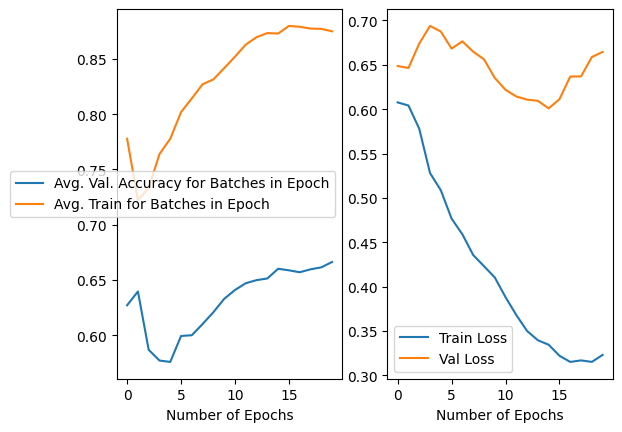

0.6662500128149986 0.66455424
8 last layer(s) unfrozen


train loss:0.0212, train accuracy:1.0000.: 100%|██████████| 240/240 [00:34<00:00,  6.89it/s]


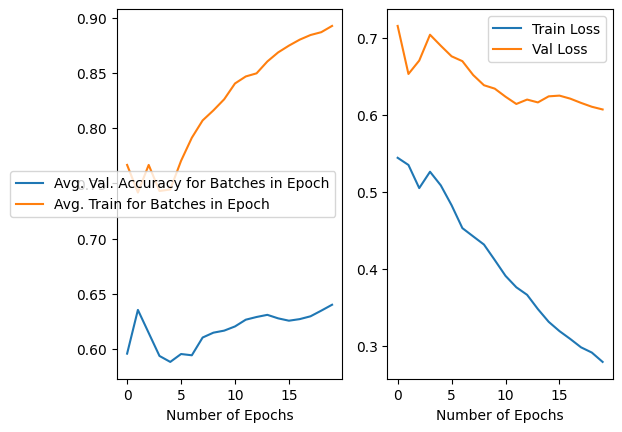

0.6401041716337204 0.6069676
9 last layer(s) unfrozen


train loss:0.0358, train accuracy:1.0000.: 100%|██████████| 240/240 [00:35<00:00,  6.86it/s]


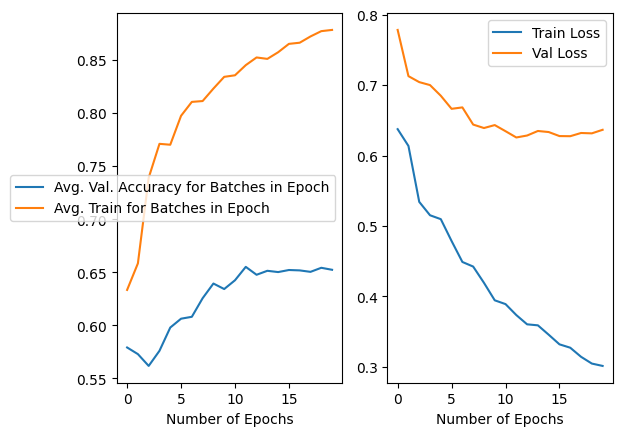

0.652291676774621 0.63648117
10 last layer(s) unfrozen


train loss:0.2701, train accuracy:1.0000.: 100%|██████████| 240/240 [00:35<00:00,  6.79it/s]


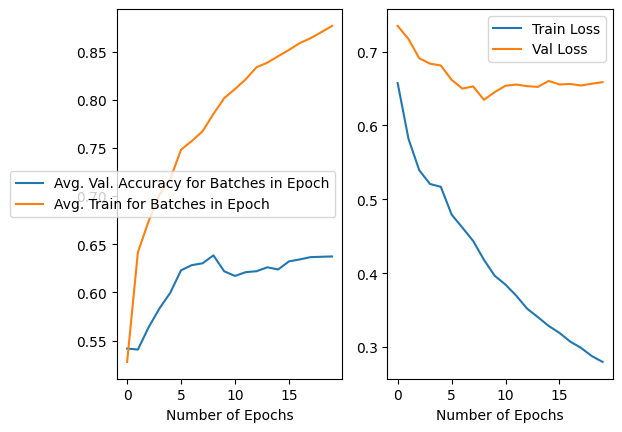

0.6372916784137488 0.6586369
11 last layer(s) unfrozen


train loss:0.1095, train accuracy:1.0000.: 100%|██████████| 240/240 [00:35<00:00,  6.83it/s]


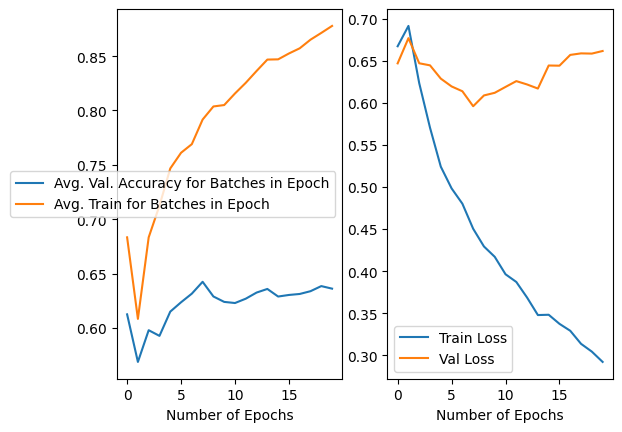

0.6361458379775285 0.661694
12 last layer(s) unfrozen


train loss:0.0869, train accuracy:1.0000.: 100%|██████████| 240/240 [00:35<00:00,  6.74it/s]


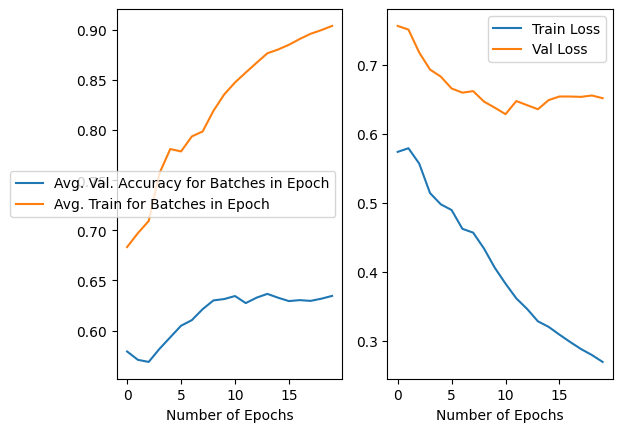

0.6345833349972964 0.651674
13 last layer(s) unfrozen


train loss:0.0348, train accuracy:1.0000.: 100%|██████████| 240/240 [00:36<00:00,  6.58it/s]


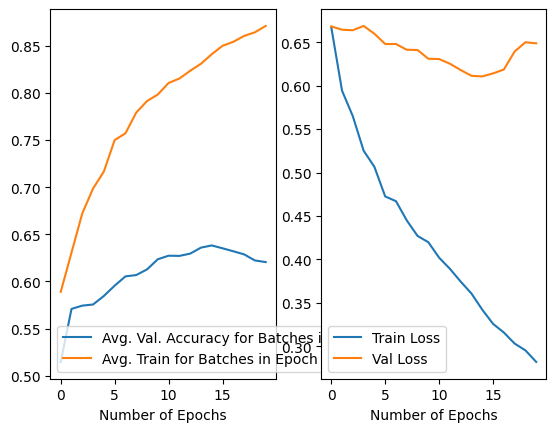

0.6205208420753479 0.6487072
14 last layer(s) unfrozen


train loss:0.1745, train accuracy:1.0000.: 100%|██████████| 240/240 [00:36<00:00,  6.54it/s]


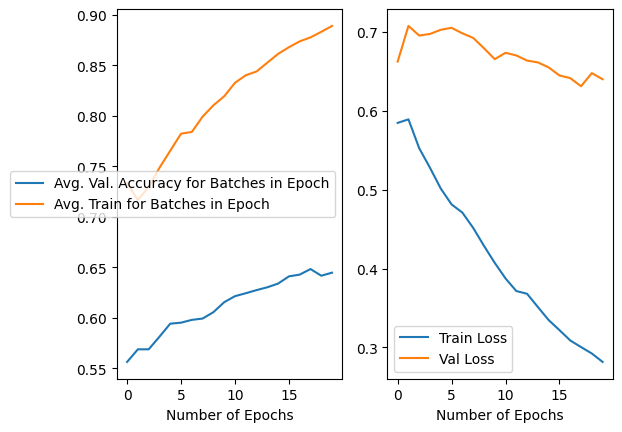

0.644687507301569 0.63998306
15 last layer(s) unfrozen


train loss:0.0756, train accuracy:1.0000.: 100%|██████████| 240/240 [00:36<00:00,  6.49it/s]


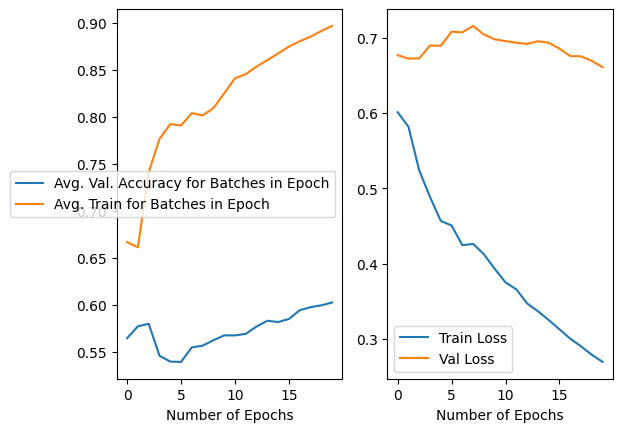

0.6023958388715982 0.66073054
16 last layer(s) unfrozen


train loss:0.0389, train accuracy:1.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.44it/s]


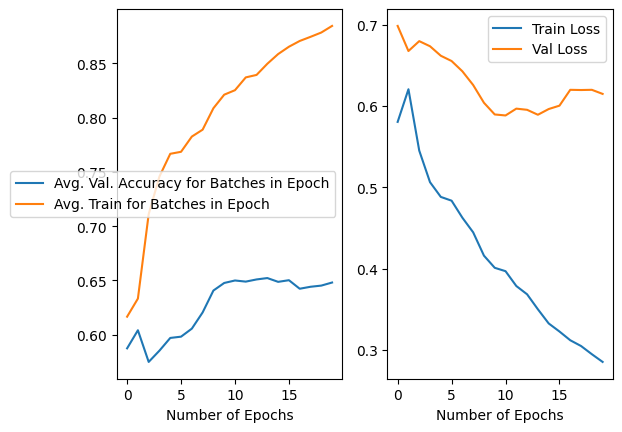

0.6481250125914813 0.61474
17 last layer(s) unfrozen


train loss:0.0984, train accuracy:1.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.47it/s]


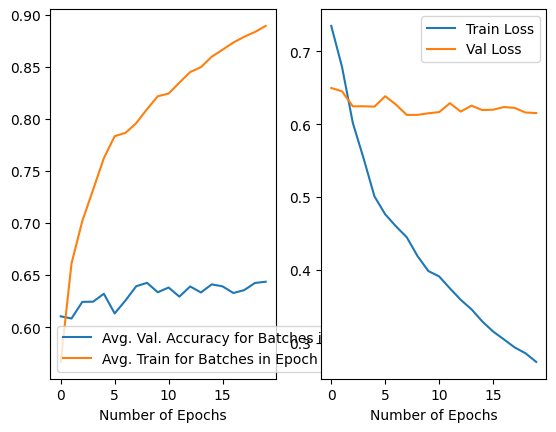

0.6436458379030228 0.6153213
18 last layer(s) unfrozen


train loss:0.1114, train accuracy:1.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.44it/s]


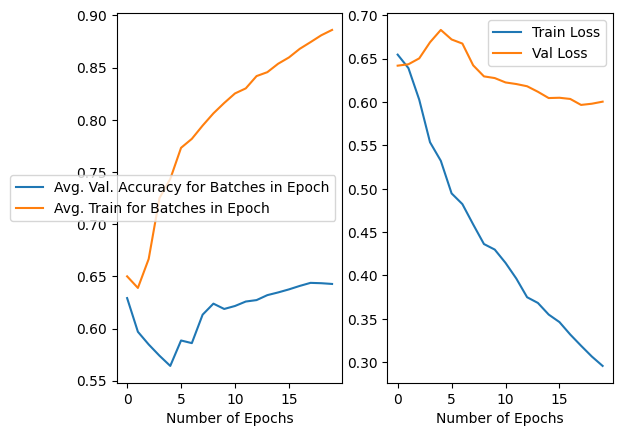

0.6427083391696214 0.6003661
19 last layer(s) unfrozen


train loss:0.0073, train accuracy:1.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.44it/s]


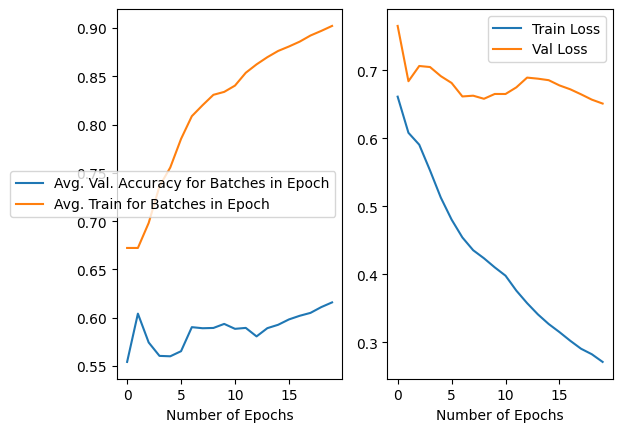

0.6158333379775286 0.6512857
20 last layer(s) unfrozen


train loss:0.0626, train accuracy:1.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.40it/s]


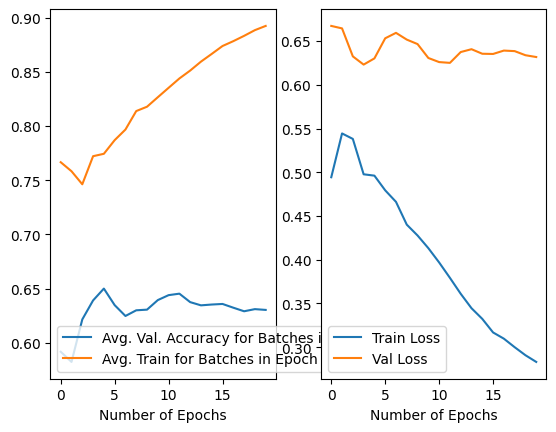

0.6303125027567148 0.6318017


In [ ]:
unfreeze_layers = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
weights = [ResNet152_Weights.DEFAULT, ResNet152_Weights.IMAGENET1K_V1, ResNet152_Weights.IMAGENET1K_V2]
for layer in unfreeze_layers:
  print(layer, 'last layer(s) unfrozen')
  train(start_frozen=True, resnet='resnet50', model_unfreeze=layer, weight=ResNet50_Weights.DEFAULT)

0 last layer(s) unfrozen


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 149MB/s]
train loss:3.0199, train accuracy:0.0000.: 100%|██████████| 240/240 [00:34<00:00,  6.91it/s]


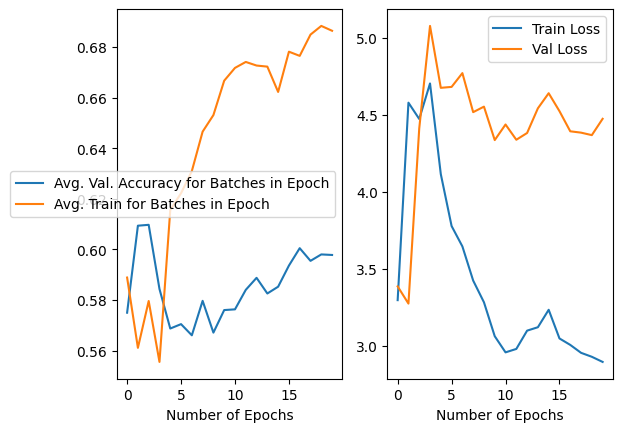

0.5978125058114528 4.4740553
1 last layer(s) unfrozen


train loss:1.1916, train accuracy:0.3333.: 100%|██████████| 240/240 [00:35<00:00,  6.72it/s]


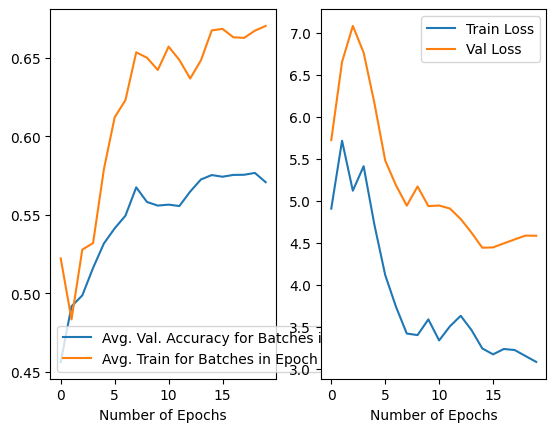

0.5707291770726443 4.582929
2 last layer(s) unfrozen


train loss:4.6775, train accuracy:0.3333.: 100%|██████████| 240/240 [00:36<00:00,  6.64it/s]


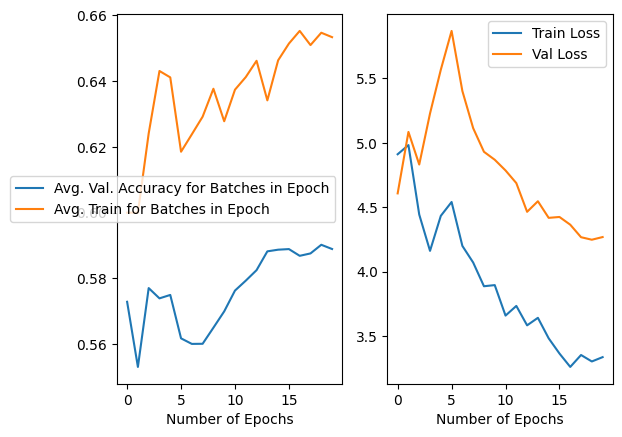

0.5889583427459002 4.2687674
3 last layer(s) unfrozen


train loss:0.0945, train accuracy:1.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.38it/s]


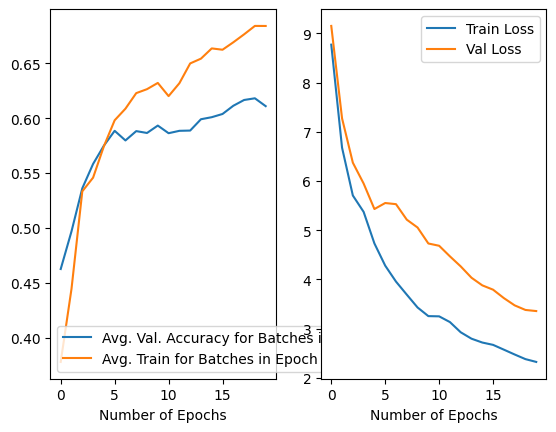

0.6110416730865836 3.3550944
4 last layer(s) unfrozen


train loss:0.1498, train accuracy:1.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.42it/s]


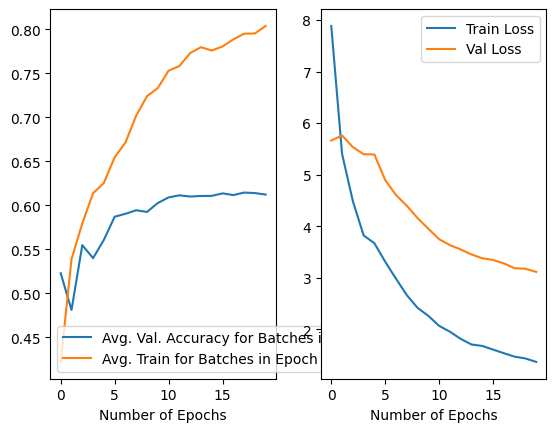

0.6122916679829359 3.113183
5 last layer(s) unfrozen


train loss:2.4797, train accuracy:0.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.36it/s]


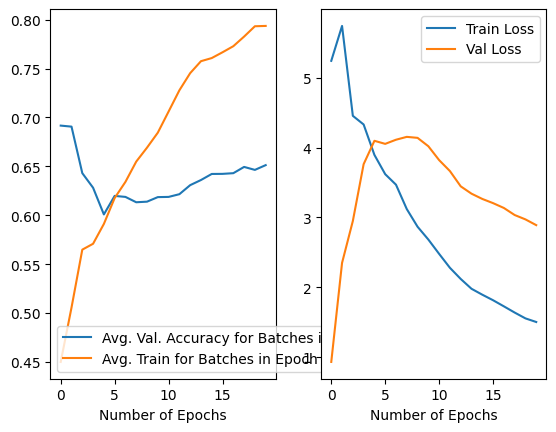

0.6512500092387199 2.8902185
6 last layer(s) unfrozen


train loss:0.0045, train accuracy:1.0000.: 100%|██████████| 240/240 [00:37<00:00,  6.36it/s]


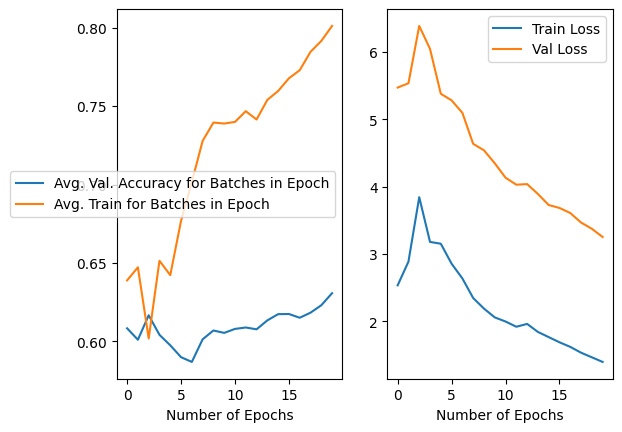

0.6307291731238365 3.2540536
7 last layer(s) unfrozen


train loss:0.0933, train accuracy:1.0000.: 100%|██████████| 240/240 [00:38<00:00,  6.21it/s]


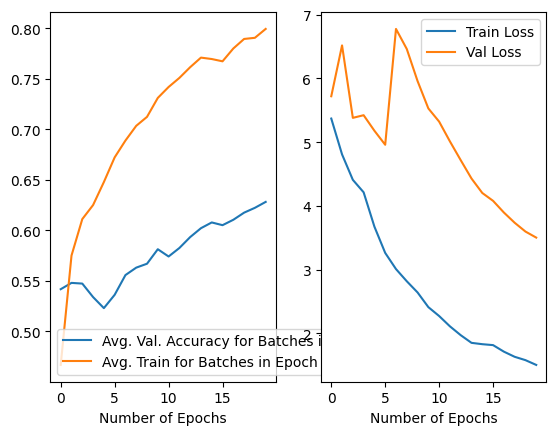

0.6281250081956387 3.5030816
8 last layer(s) unfrozen


train loss:0.0992, train accuracy:1.0000.: 100%|██████████| 240/240 [00:39<00:00,  6.11it/s]


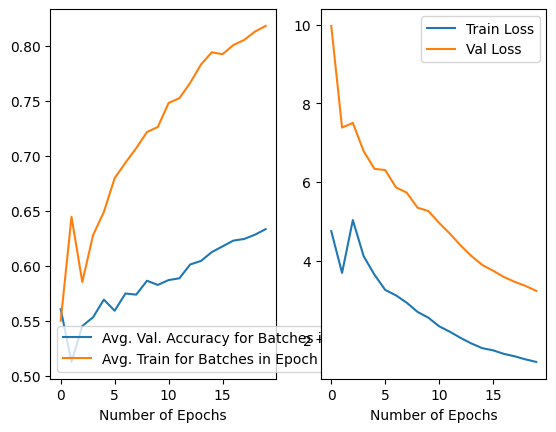

0.6332291673868895 3.2313263
9 last layer(s) unfrozen


train loss:0.0080, train accuracy:1.0000.: 100%|██████████| 240/240 [00:40<00:00,  5.97it/s]


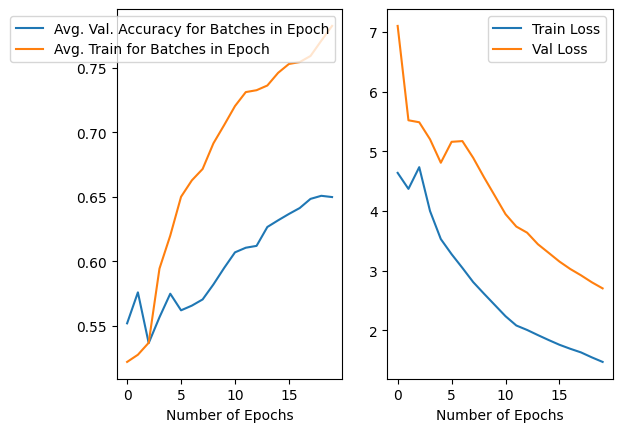

0.6497916784137487 2.7046294
10 last layer(s) unfrozen


train loss:0.0179, train accuracy:1.0000.: 100%|██████████| 240/240 [00:39<00:00,  6.11it/s]


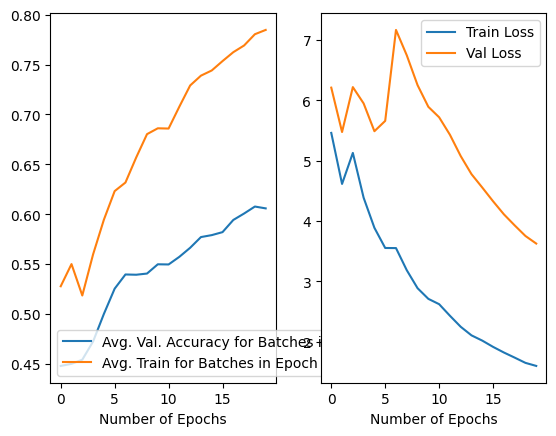

0.6058333411812782 3.6260688
11 last layer(s) unfrozen


train loss:0.1244, train accuracy:1.0000.: 100%|██████████| 240/240 [00:39<00:00,  6.04it/s]


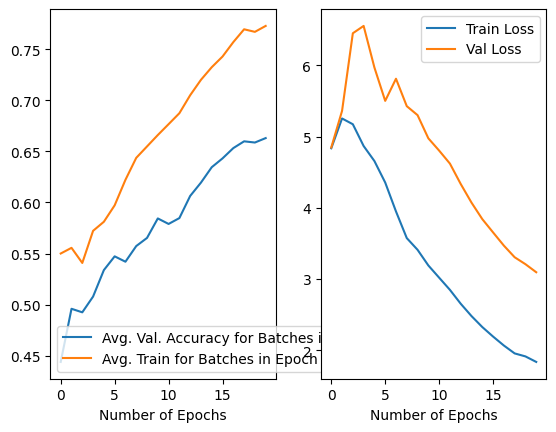

0.6631250075995923 3.0963616
12 last layer(s) unfrozen


train loss:1.1536, train accuracy:0.3333.: 100%|██████████| 240/240 [00:39<00:00,  6.07it/s]


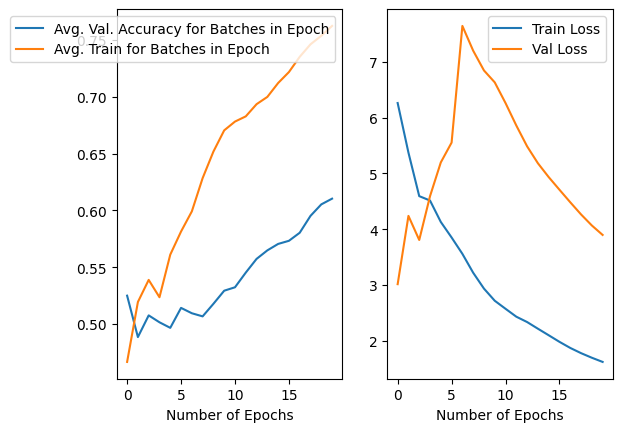

0.6104166753590107 3.897178
13 last layer(s) unfrozen


train loss:0.0027, train accuracy:1.0000.: 100%|██████████| 240/240 [00:40<00:00,  5.90it/s]


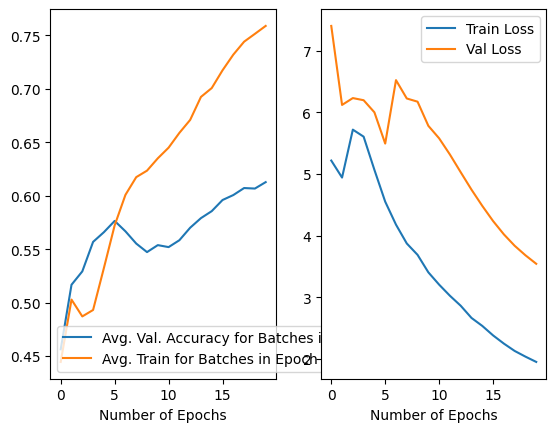

0.612708342820406 3.5418923
14 last layer(s) unfrozen


train loss:0.0396, train accuracy:1.0000.: 100%|██████████| 240/240 [00:40<00:00,  5.97it/s]


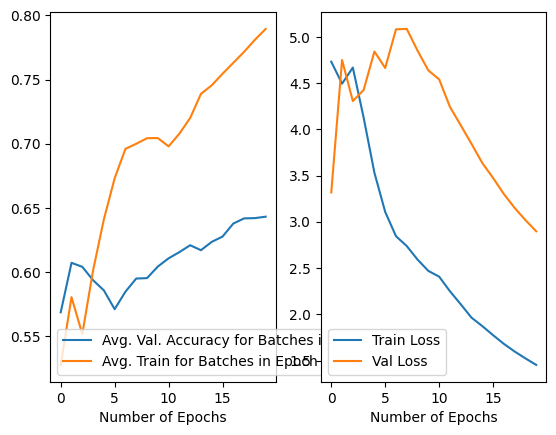

0.6432291679084301 2.89786
15 last layer(s) unfrozen


train loss:0.0124, train accuracy:1.0000.: 100%|██████████| 240/240 [00:41<00:00,  5.75it/s]


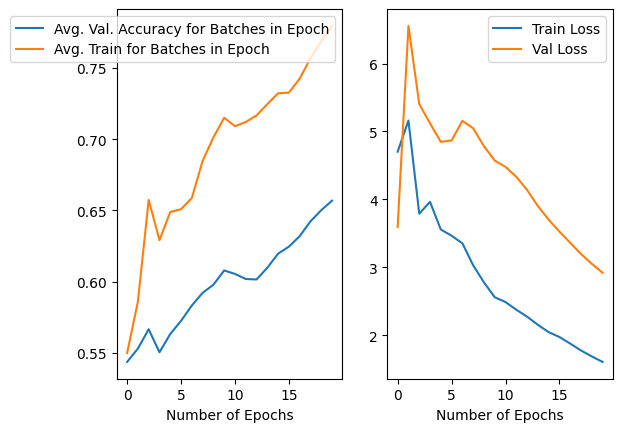

0.6568750038743019 2.9188704
16 last layer(s) unfrozen


train loss:0.4595, train accuracy:0.6667.: 100%|██████████| 240/240 [00:41<00:00,  5.76it/s]


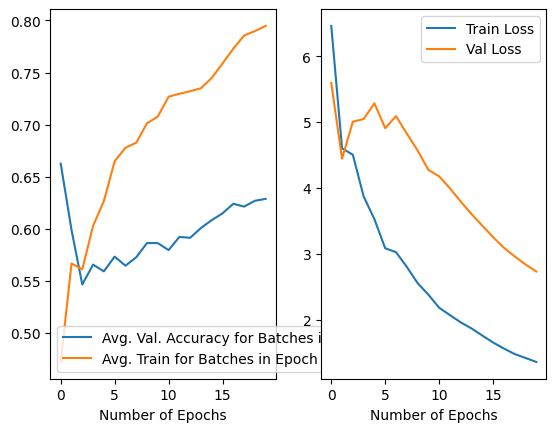

0.6287500040605665 2.7309492
17 last layer(s) unfrozen


train loss:0.0200, train accuracy:1.0000.: 100%|██████████| 240/240 [00:40<00:00,  5.90it/s]


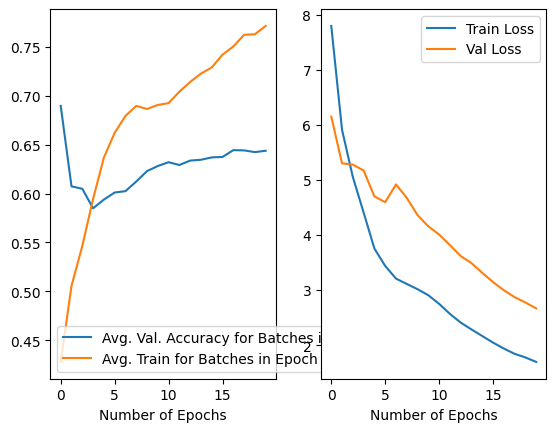

0.6437500152736902 2.6672025
18 last layer(s) unfrozen


train loss:0.6278, train accuracy:0.6667.: 100%|██████████| 240/240 [00:40<00:00,  5.90it/s]


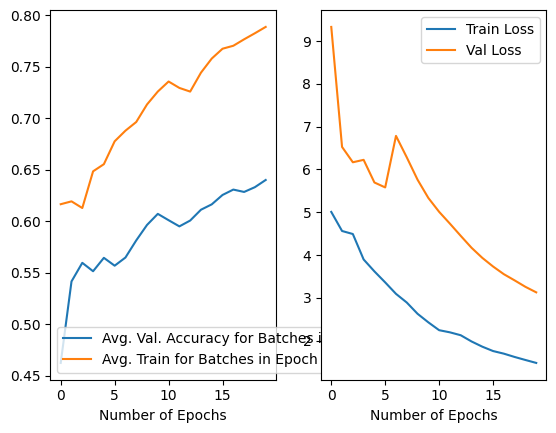

0.6402083415538072 3.126559
19 last layer(s) unfrozen


train loss:1.6899, train accuracy:0.3333.: 100%|██████████| 240/240 [00:41<00:00,  5.77it/s]


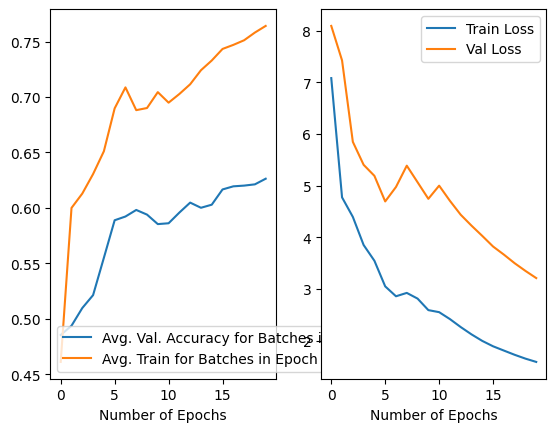

0.6263541735708713 3.2103677
20 last layer(s) unfrozen


train loss:0.1121, train accuracy:1.0000.: 100%|██████████| 240/240 [00:41<00:00,  5.78it/s]


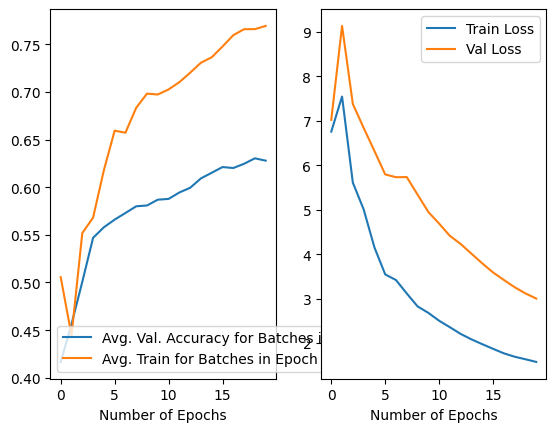

0.6278125073760747 3.0018864


In [ ]:
unfreeze_layers = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
weights = [ResNet152_Weights.DEFAULT, ResNet152_Weights.IMAGENET1K_V1, ResNet152_Weights.IMAGENET1K_V2]
for layer in unfreeze_layers:
  print(layer, 'last layer(s) unfrozen')
  train(start_frozen=True, resnet='resnet50', model_unfreeze=layer, weight=ResNet50_Weights.IMAGENET1K_V1)

0 last layer(s) unfrozen


train loss:0.3071, train accuracy:1.0000.: 100%|██████████| 240/240 [00:39<00:00,  6.02it/s]


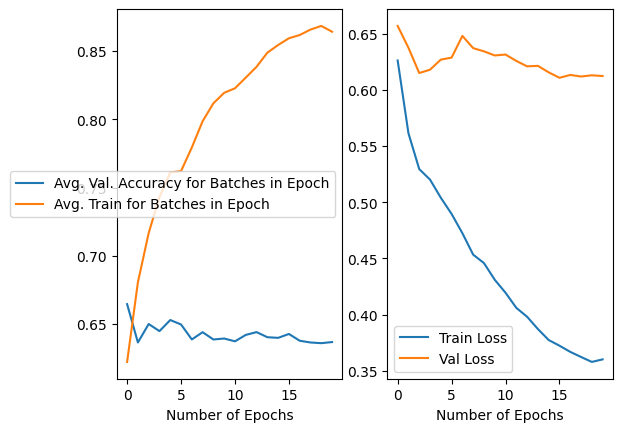

0.6367708388715982 0.6123484
1 last layer(s) unfrozen


train loss:0.1740, train accuracy:1.0000.: 100%|██████████| 240/240 [00:40<00:00,  5.97it/s]


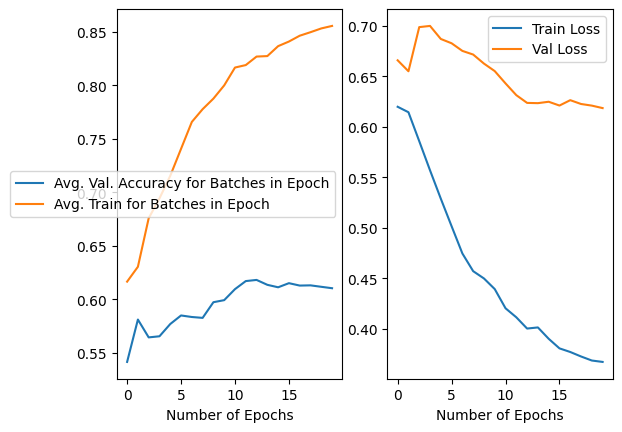

0.6105208409950137 0.618543
2 last layer(s) unfrozen


train loss:0.2920, train accuracy:1.0000.: 100%|██████████| 240/240 [00:41<00:00,  5.85it/s]


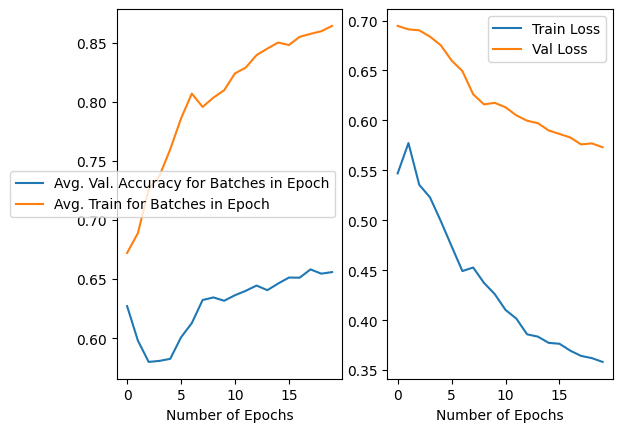

0.6559375077486038 0.57315904
3 last layer(s) unfrozen


train loss:0.0644, train accuracy:1.0000.: 100%|██████████| 240/240 [00:40<00:00,  5.96it/s]


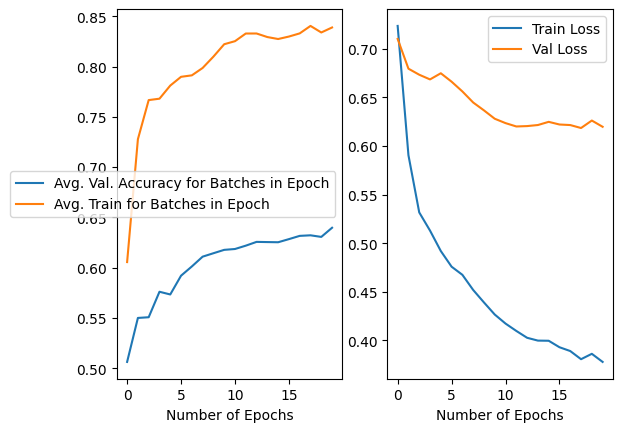

0.6396875122562051 0.61983955
4 last layer(s) unfrozen


train loss:0.4622, train accuracy:0.6667.: 100%|██████████| 240/240 [00:40<00:00,  5.88it/s]


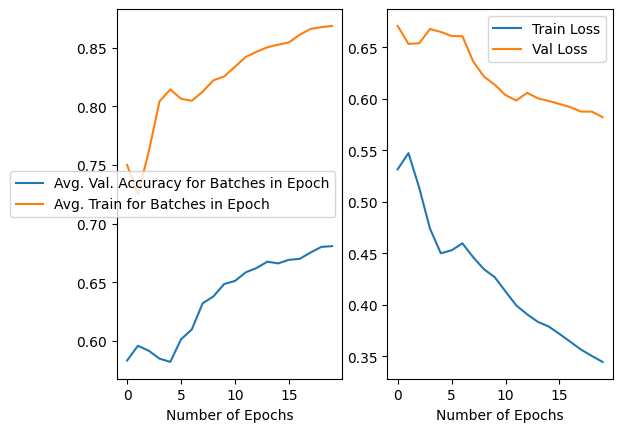

0.6808333404362201 0.58226156
5 last layer(s) unfrozen


train loss:0.3073, train accuracy:0.6667.: 100%|██████████| 240/240 [00:41<00:00,  5.71it/s]


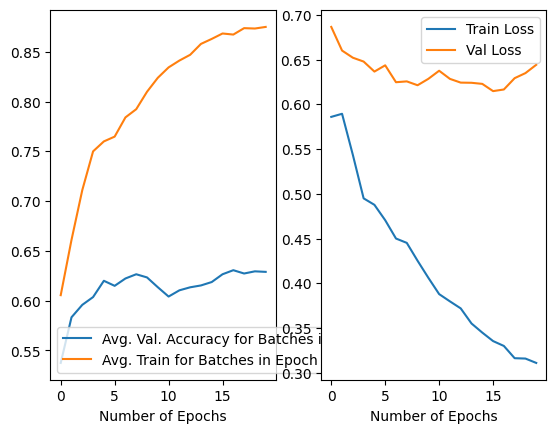

0.6289583425968885 0.6442276
6 last layer(s) unfrozen


train loss:0.0785, train accuracy:1.0000.: 100%|██████████| 240/240 [00:41<00:00,  5.73it/s]


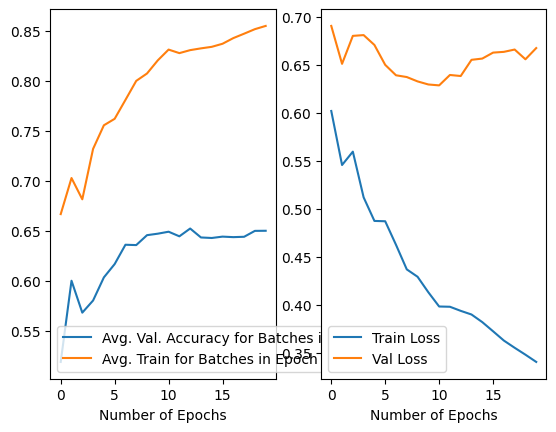

0.6500000033527613 0.6674528
7 last layer(s) unfrozen


train loss:0.0479, train accuracy:1.0000.: 100%|██████████| 240/240 [00:43<00:00,  5.46it/s]


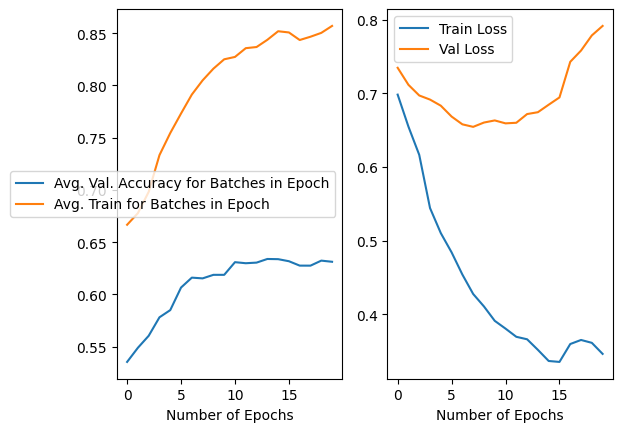

0.6312500108033419 0.79152626
8 last layer(s) unfrozen


train loss:0.1411, train accuracy:1.0000.: 100%|██████████| 240/240 [00:42<00:00,  5.71it/s]


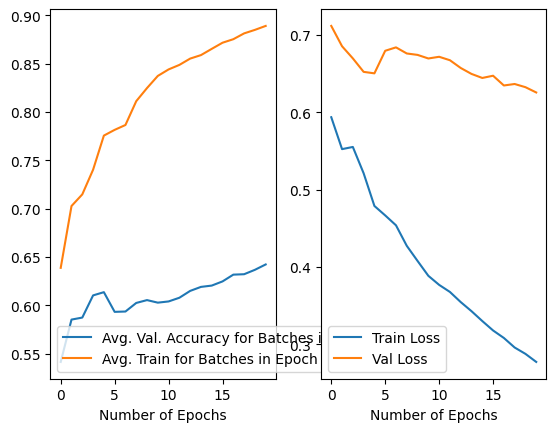

0.6423958390951157 0.6254526
9 last layer(s) unfrozen


train loss:0.0459, train accuracy:1.0000.: 100%|██████████| 240/240 [00:42<00:00,  5.63it/s]


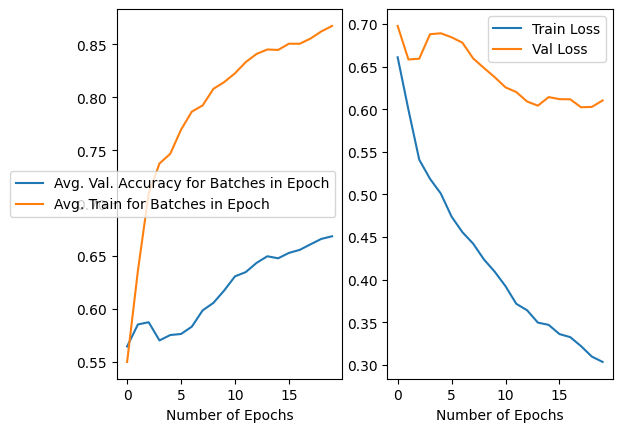

0.6687500089406967 0.6102768
10 last layer(s) unfrozen


train loss:0.1924, train accuracy:1.0000.: 100%|██████████| 240/240 [00:43<00:00,  5.53it/s]


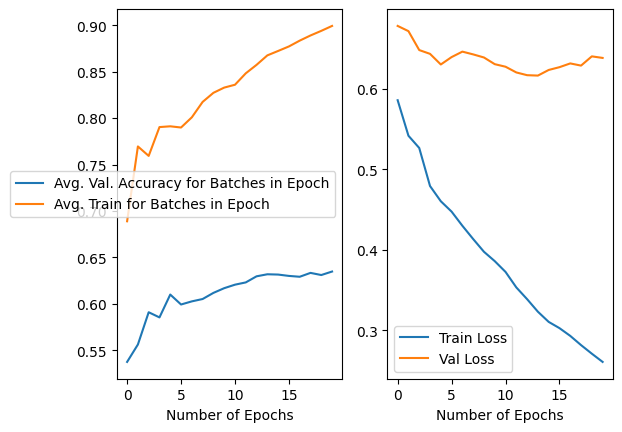

0.63479167483747 0.6387762
11 last layer(s) unfrozen


train loss:0.1854, train accuracy:1.0000.: 100%|██████████| 240/240 [00:43<00:00,  5.56it/s]


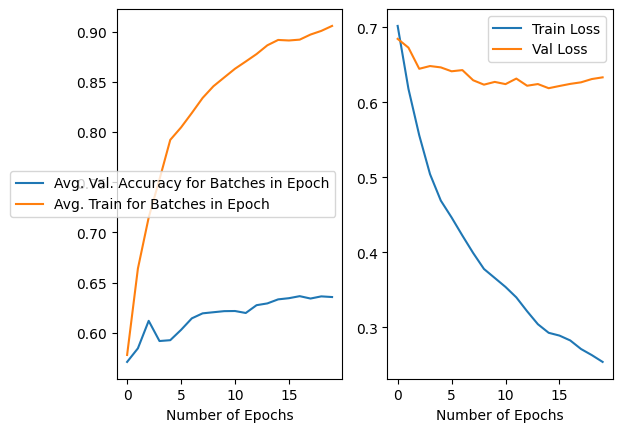

0.6355208396911621 0.63352257
12 last layer(s) unfrozen


train loss:0.5183, train accuracy:0.6667.: 100%|██████████| 240/240 [00:44<00:00,  5.44it/s]


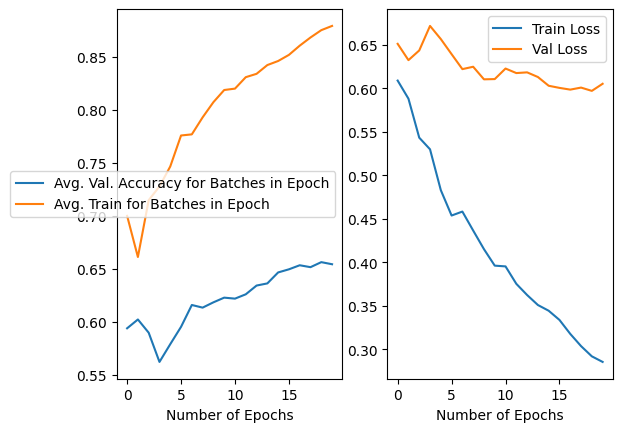

0.6542708411812782 0.60508
13 last layer(s) unfrozen


train loss:0.0633, train accuracy:1.0000.: 100%|██████████| 240/240 [00:43<00:00,  5.47it/s]


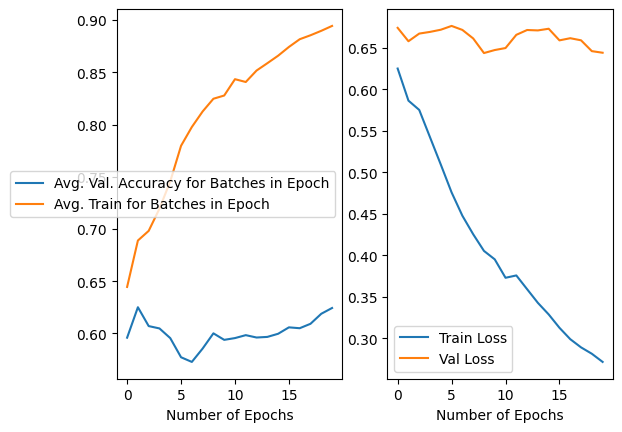

0.6242708411067724 0.6442563
14 last layer(s) unfrozen


train loss:0.0328, train accuracy:1.0000.: 100%|██████████| 240/240 [00:43<00:00,  5.49it/s]


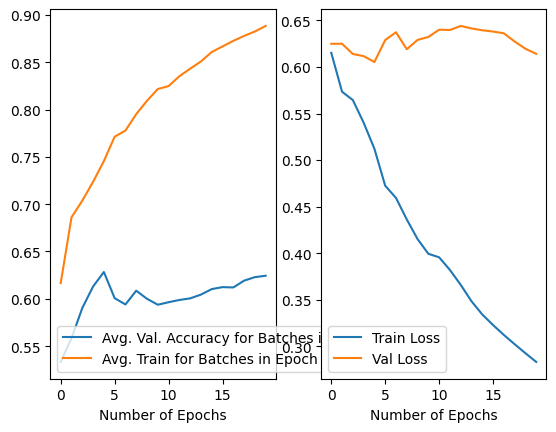

0.6243750054389239 0.6140224
15 last layer(s) unfrozen


train loss:0.4936, train accuracy:0.6667.: 100%|██████████| 240/240 [00:44<00:00,  5.35it/s]


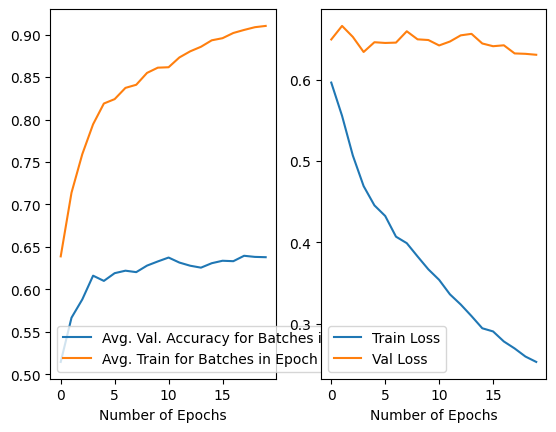

0.6379166770726442 0.6305308
16 last layer(s) unfrozen


train loss:0.8660, train accuracy:0.3333.: 100%|██████████| 240/240 [00:44<00:00,  5.43it/s]


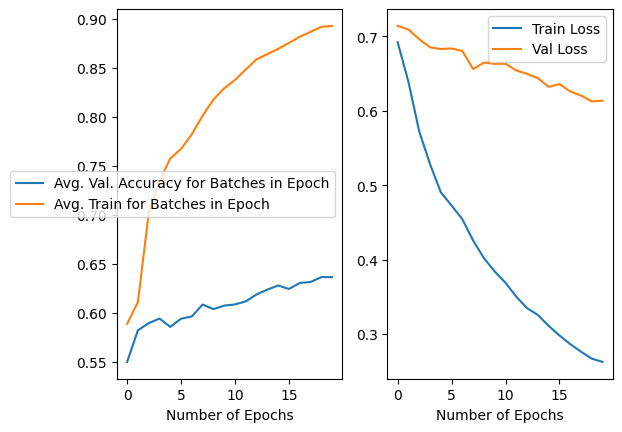

0.6365625098347664 0.6137377
17 last layer(s) unfrozen


train loss:0.0517, train accuracy:1.0000.: 100%|██████████| 240/240 [00:45<00:00,  5.27it/s]


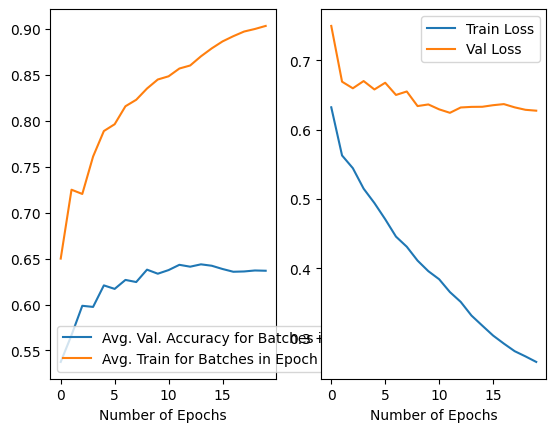

0.6367708411067724 0.62732375
18 last layer(s) unfrozen


train loss:0.3660, train accuracy:1.0000.: 100%|██████████| 240/240 [00:44<00:00,  5.37it/s]


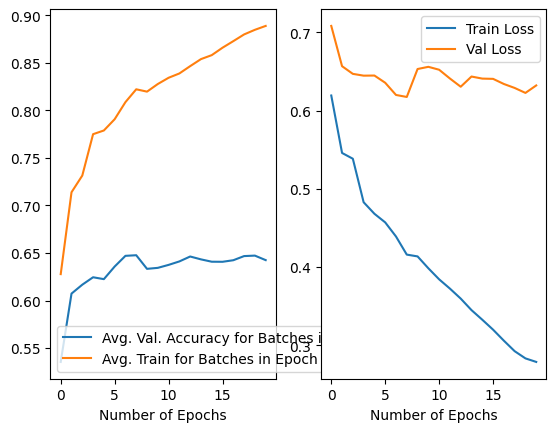

0.6425000052899122 0.63202584
19 last layer(s) unfrozen


train loss:0.2164, train accuracy:1.0000.: 100%|██████████| 240/240 [00:45<00:00,  5.25it/s]


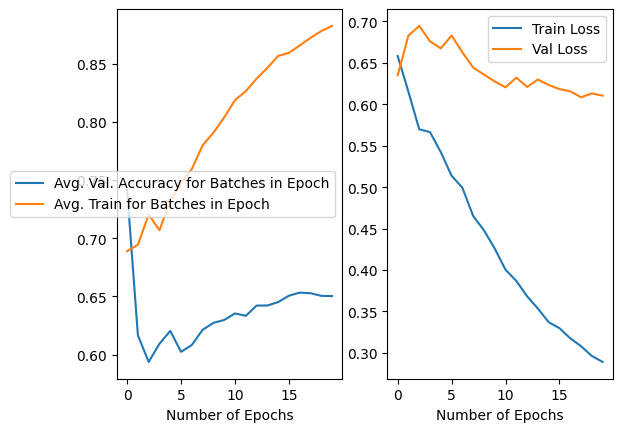

0.6503125075250864 0.61053556
20 last layer(s) unfrozen


train loss:0.3078, train accuracy:1.0000.: 100%|██████████| 240/240 [00:46<00:00,  5.19it/s]


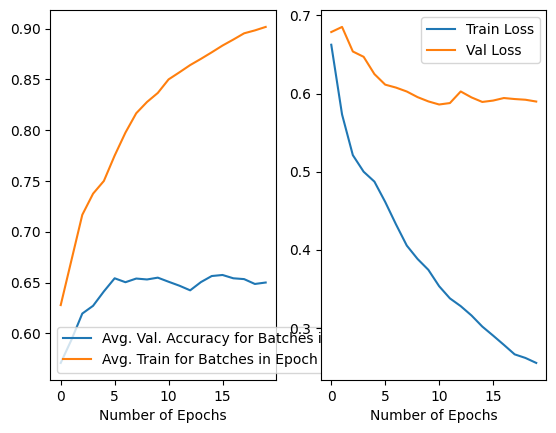

0.6500000111758709 0.58974934


In [ ]:
unfreeze_layers = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
weights = [ResNet152_Weights.DEFAULT, ResNet152_Weights.IMAGENET1K_V1, ResNet152_Weights.IMAGENET1K_V2]
for layer in unfreeze_layers:
  print(layer, 'last layer(s) unfrozen')
  train(start_frozen=True, resnet='resnet50', model_unfreeze=layer, weight=ResNet50_Weights.IMAGENET1K_V2)

# MobileNet Classifier

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import os
import pathlib
import PIL
import PIL.Image
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import History
#assert tf.__version__.startswith('1')
import tensorflow_datasets as tfds
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import History

history = History()

data_dir_train = "./drive/MyDrive/image_classification/seg_train"
data_dir_val = "./drive/MyDrive/image_classification/seg_test"
#data_dir = pathlib.Path(data_dir)

#img_size = (224, 224)
#batch_size = 32

#damaged = list(data_dir.glob('damaged/*'))
#PIL.Image.open(str(damaged[5]))


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set your dataset paths
train_data_dir = data_dir_train
validation_data_dir = data_dir_val

# Define image data generators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,  # Rescale pixel values to [0, 1]
    rotation_range=20,  # Example: data augmentation options
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

validation_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Set batch size and target image size
batch_size = 32
image_size = (800, 800)

# Load and preprocess training data
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Load and preprocess validation data
validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

Found 58 images belonging to 2 classes.
Found 29 images belonging to 2 classes.


In [ ]:
train_data, train_labels = train_generator.next()
val_data, val_labels = validation_generator.next()

In [ ]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(800, 800, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)  # Add Global Average Pooling layer
x = Dense(1024, activation='relu')(x)  # Add a fully connected layer
predictions = Dense(2, activation='softmax')(x)  # Add the final output layer with num_classes neurons

model = Model(inputs=base_model.input, outputs=predictions)

In [ ]:
####### Optional freexing/unfreezing layers #########
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
model.compile(optimizer=Adam(lr=0.01), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.fit(train_data, train_labels, epochs=100, validation_data=(val_data, val_labels), callbacks=[history])

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.1018 - val_accuracy: 0.7241
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 8.9689e-04 - accuracy: 1.0000 - val_loss: 1.3854 - val_accuracy: 0.7586
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 0.0090 - accuracy: 1.0000 - val_loss: 1.2227 - val_accuracy: 0.6207
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.7321 - val_accuracy: 0.6897
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.0497 - accuracy: 1.0000 - val_loss: 1.1823 - val_accuracy: 0.6552
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 5.8505e-04 - accuracy: 1.0000 - val_loss: 1.3646 - val_accuracy: 0.7586
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 1.8208 - val_accuracy: 0.7586
Epoch 8/100
1/1 [=========

In [ ]:
predictions = model.predict(val_data)

1/1 [==============================] - 1s 993ms/step


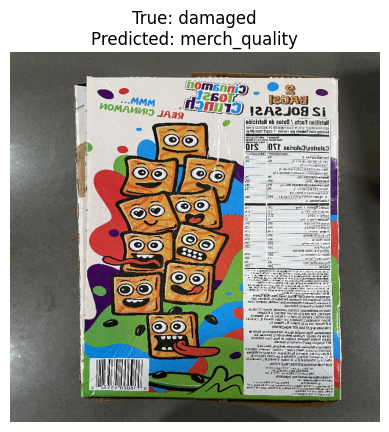

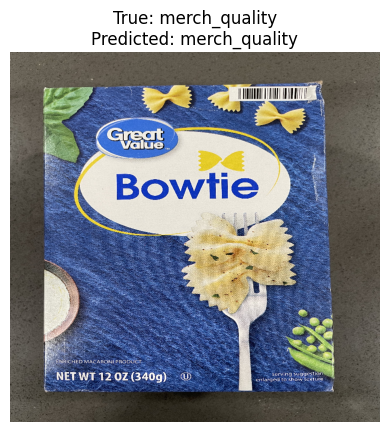

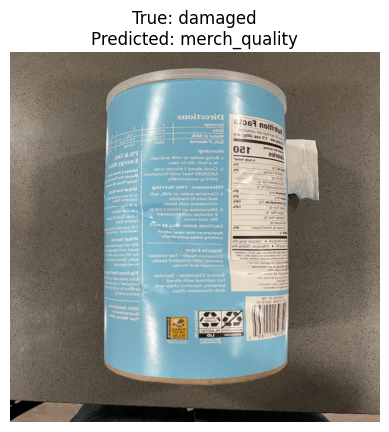

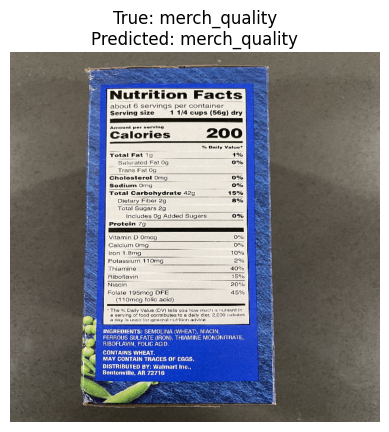

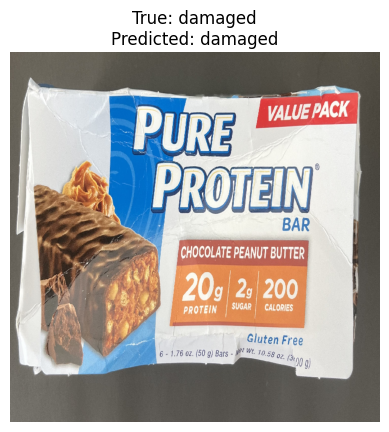

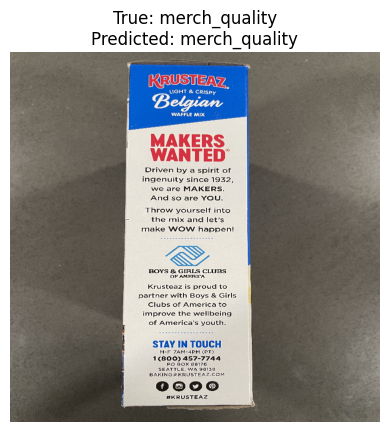

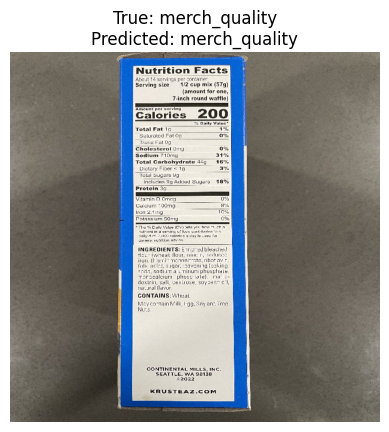

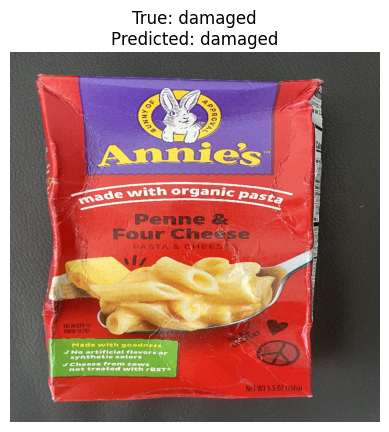

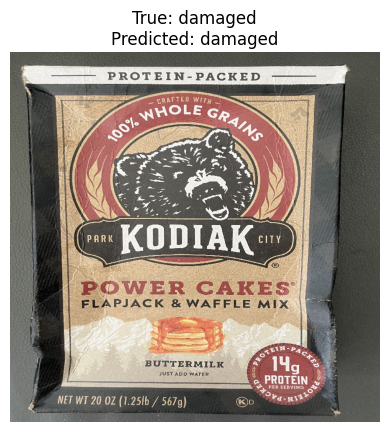

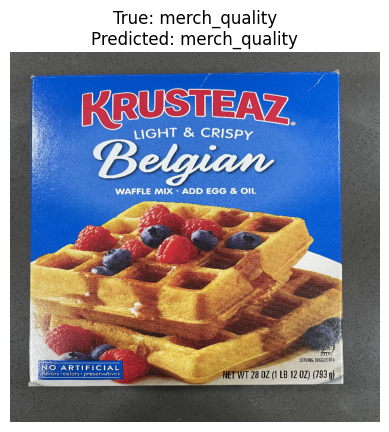

In [ ]:
class_labels = ["damaged", "merch_quality"]  # Replace with your actual class labels

# Define the number of images you want to display
num_images_to_display = 10

# Select a random subset of images to display
indices_to_display = np.random.choice(val_data.shape[0], num_images_to_display, replace=False)

# Display the images and predictions
for i in indices_to_display:
    image = val_data[i]  # Get an image
    true_label = class_labels[np.argmax(val_labels[i])]  # True label
    predicted_label = class_labels[np.argmax(predictions[i])]  # Predicted label

    plt.figure()
    plt.imshow(image)
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
    plt.axis('off')

plt.show()

In [ ]:
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Calculate averages
average_training_accuracy = sum(training_accuracy) / len(training_accuracy)
average_validation_accuracy = sum(validation_accuracy) / len(validation_accuracy)
average_training_loss = sum(training_loss) / len(training_loss)
average_validation_loss = sum(validation_loss) / len(validation_loss)

# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Plot average accuracy
plt.subplot(121)
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.set_xlabel('Epoch')
plt.set_ylabel('Accuracy')
plt.set_title('Training and Validation Accuracy Over Epochs')
plt.legend()

# Plot average loss
plt.subplot(122)
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.set_xlabel('Epoch')
plt.set_ylabel('Loss')
plt.set_title('Training and Validation Loss Over Epochs')
plt.legend()

# Show the plot
plt.show()

NameError: ignored